# Цифровые full data-driven модели ценообразования на рынке сельскохозяйственных земель Омской области в третьем квартале 2024 года (материал находится в разработе)

[К.А. Мурашев](https://t.me/Kirjasalo)* (ООО "Совконсалт"), [Е.В. Ткаченко](https://t.me/elen_1212)* (Некоммерческое партнёрство "Омская Коллегия Оценщиков"). * в алфавитном порядке

Данный материал представляет собой backend-часть исследования рынка сельскохозяйственных земель Омской области во 2-3 квартале 2024 года. Данный материал полностью основан на данных и не включает в себя какие-либо субъективные либо опросные значения. При его подготовке, использовался модуль'[Syväjärvi](https://t.me/AIinValuation)' разработанный компаниями Sovconsult DOO (Совконсалт ООО) и Meleksa AB предназначенный для интеллектуального анализа данных рынков и разработки моделей ценообразования на основе технологий искусственного интеллекта. Исходные данные для анализа были предоставлены "[Омской Коллегией Оценщиков](https://око55.рф/)" и размещены в [свободном доступе](https://web.tresorit.com/l/jPHmL#6Z_L62XP4tDLQh2AhM2tMA) согласно ["Требованиям к использованию информации и данных в оценке, судебной и несудебной экспертизе при определении рыночной и иной стоимости объектов недвижимости"](http://sroroo.ru/upload/iblock/7f6/VO_02_24-small.pdf).

При разработке данного исследования, были использованы данные о 85 объектах представляющих собой оферты о продаже земельных участков для сельскохозяйственного производства. Сбор данных и их первичная обработка были осуществлены на стороне Омской коллегии оценщиков. 

Данный материал содержит следующие разделы:

1. Тематические карты: агроклиматическое зонирование, тепловая карта цен аналогов, тепловая карта средних и медианных цен по районам.
1. Описательные статистики рынка.
1. Изолированный анализ т.е., анализ влияние на стоимость каждого признака по отдельности.
1. Совместный анализ т.е., анализ влияние всех признаков с учётом их взаимодействия.
1. Предсказательные модели для расчёта стоимости включая онлайн-калькуляторы.

Данный материал предназначен для решения следующих задач:
1. Комплаенс мероприятия.
1. Антифродинговые процедуры.
1. Оценка рисков.
1. Информационное обеспечение подразделений экономической безопасности.
1. Автоматизированный налоговый контроль.
1. Формирование представления о ценообразовании на рынке сельскохозяйственных земель Омской области во втором и третьем квартале 2024 года.
1. Предсказание стоимости объектов на рынке сельскохозяйственных земель Омской области во втором и третьем квартале 2024 года на основе предложенных моделей.
1. Мониторинг стоимости активов и их портфелей.
1. Контроль результатов работы независимых оценщиков.
1. Ознакомление с технологиями анализа данных в оценке стоимости.
1. Автоматическое изготовление справок о стоимости для сотрудников Федеральной Службы Безопасности Российской Федерации, Следственного Комитета  Российской Федерации и Министерства Внутренних Дел Российской Федерации.

In [24]:
# Import libraries
import geopandas as gpd
import folium
from shapely.ops import unary_union
import pandas as pd
import json
import pandas as pd
import branca.colormap as cm
import random
import numpy as np
import seaborn as sns
from syvajarvirus55a243 import create_map_m0
from syvajarvirus55a243 import create_map_m1
from syvajarvirus55a243 import create_map_m2
from syvajarvirus55a243 import calculate_descriptive_statistics
from syvajarvirus55a243 import linear_regression_plot
from syvajarvirus55a243 import plot_isolated_analysis
from syvajarvirus55a243 import perform_linear_regression
from syvajarvirus55a243 import plot_violin_comparison
from syvajarvirus55a243 import plot_kde_comparison
from syvajarvirus55a243 import perform_mann_whitney_tests
from syvajarvirus55a243 import mann_whitney_effect_sizes
from syvajarvirus55a243 import perform_roc_analysis
from syvajarvirus55a243 import perform_logistic_regression
from syvajarvirus55a243 import compare_groups_with_ratios
from syvajarvirus55a243 import compare_groups_with_differences
from syvajarvirus55a243 import plot_kde_with_log_transform
from syvajarvirus55a243 import plot_pie_chart
from syvajarvirus55a243 import plot_bar_chart


# Set random  seed
random.seed(552644099)  # Set seed for reproducibility

## Тематические карты

### Агроклиматическое зонирование Омской области

Согласно данным Омской колегии оценщиков, в Омской области выделяют две климатические зоны: северную и южную, а также четыре агроклиматических района: северный, северная лесостепь, южная лесостепь, степь. Далее приводится код для построения интерактивной карты. В правом верхнем углу находится кнопка вызова меню для управления слоями.  Картографическая основа [OpenStreetMap](https://www.openstreetmap.org) (Лицензия: [Open Data Commons Open Database License (ODbL)](https://opendatacommons.org/licenses/odbl/)). При построении карты использовались правила зоны UTM Zone 43N и соответствующая ей проекция epsg=32643.

In [2]:
# Specify the path to your GeoJSON file
geojson_path = 'omsk_region.geojson'

# Create the map m0
m0 = create_map_m0(geojson_path)

# Display the map
m0

### Ценовое зонирование

Построим карту наблюдений. Цвет точки зависит от цены за 1 кв. м. Тепловая шкала показана в верхней части карты. При наведении курсора на объект, всплывает инфомационное окно с основными сведениям о нём. Управление слоями также осуществляется с помощью кнопки в правом верхнем углу.

In [3]:
# Specify the paths to your GeoJSON and CSV files
geojson_path = 'omsk_region.geojson'
csv_path = 'data_omsk_agro_243.csv'

# Create the map m1
m1 = create_map_m1(geojson_path, csv_path)

# Display the map
m1

Построим тепловую карту средних и медианных цен по районам. Переключение между средними и медианные ценами осуществляется кнопкой управления слоями.

In [4]:
# Specify the paths to your GeoJSON and CSV files
geojson_path = 'omsk_region.geojson'
csv_path = 'data_omsk_agro_243.csv'

# Create the map m2
m2 = create_map_m2(geojson_path, csv_path)

# Display the map
m2


### Описательные статистики рынка

Рассматриваемый набор данных, предоставленный НП "Омская коллегия оценщиков" включает следующие переменные:

1. id &mdash; универсальный идентификатор объекта;
1. latutude &mdash; широта объекта;
1. longitude  &mdash; долгота объекта;
1. climate_zone  &mdash; климатическая зона (северная либо южная);
1. agricultural_zone &mdash; агроклиматический район (северный, северная лесостепь, южная лесостепь, южная);
1. district &mdash; район расположения объекта;
1. price &mdash; цена оферты за объект в рублях, НДС не облагается;
1. area &mdash; площадь объекта в квадратных метрах;
1. ownership &mdash; тип права на объект: частная собственность либо долевая (в т.ч. пай);
1. permitted &mdash; вид разрешённого использования: сельскозяйственное использование, личное подсобное хозяйство;
1. actual &mdash; фактическое использование участка: пашня, сенокос, пастбище, кормовые угодья, не используется и т.д.;
1. crop_yield &mdash; балл бонитета;
1. capital_distance &mdash; расстояние от Омска;
1. elevator_distance &mdash; расстояние от ближайщего элеватора;
1. is_paved_road &mdash; индикатор наличия подъезда к участку по дороге с твёрдым покрытием;
1. shape &mdash; форма участка с точки зрения удобства механизированной обработки (простая, сложная);
1. is_marked &mdash; индикатор наличия установленных границ участка;
1. is_coast &mdash; индикатор наличия собственной береговой линии;
1. offer_date &mdash; дата фиксации оферты;
1. is_brokerage &mdash; индикатор наличия посредника в виде агентства недвижимости;
1. is_single &mdash; индикатор одноконтурности участка;
1. is_electricity &mdash; индикатор электрификации участка;
1. is_gas &mdash; индикатор газификации участка.


Рассчитаем основные метрики для количественных переменных: 'price', 'area', 'price_per_sqm', 'crop_yield', 'capital_distance', 'elevator_distance'. Среди таких метрик: среднее, медиана, минимальное, максимальное, размах, дисперсия, стандартное отклонение, коэффициент ассиметрии, коэффициент эксцесса, 5, 10, 25, 50, 75, 90, 95 перцентили, коэффициент вариации, среднее абсолютное отклонение.


In [5]:
# Read data
df = pd.read_csv('data_omsk_agro_243.csv')

# List of numerical columns to analyze
df['price_per_sqm'] = df['price'] / df['area']

# Create separate Data Frames for different groups of districts
specific_districts = ['Омский район']  # List of districts to include
df_omsk = df[df['district'].isin(specific_districts)]
df_not_omsk = df[~df['district'].isin(specific_districts)]


In [6]:
# Define numerical columns list
numerical_columns = ['price', 'area', 'price_per_sqm', 'crop_yield', 'capital_distance', 'elevator_distance']

# Calculate descriptive statistics
stats_df = calculate_descriptive_statistics(df, numerical_columns)

# Display the statistics
print(stats_df)

                   count          mean         median           min  \
price               90.0  1.769636e+06  850000.000000  85000.000000   
area                90.0  4.370873e+05  138000.000000   9897.000000   
price_per_sqm       90.0  1.550428e+01       5.662393      0.118334   
crop_yield          90.0  6.275556e+01      70.000000     40.000000   
capital_distance    90.0  8.954444e+01      64.500000      0.000000   
elevator_distance   90.0  5.765556e+01      37.000000      1.500000   

                            max         range      variance       std_dev  \
price              1.300000e+07  1.291500e+07  5.653988e+12  2.377812e+06   
area               1.121776e+07  1.120786e+07  1.652466e+12  1.285483e+06   
price_per_sqm      1.150370e+02  1.149186e+02  5.149360e+02  2.269220e+01   
crop_yield         7.300000e+01  3.300000e+01  1.182991e+02  1.087654e+01   
capital_distance   5.150000e+02  5.150000e+02  7.676723e+03  8.761691e+01   
elevator_distance  2.990000e+02  2.97500

Данные статистики доступны в файле `data_omsk_agro_243_stats.csv`.

In [7]:
stats_df.to_csv('data_omsk_agro_243_stats.csv', index=True)

In [8]:
# Calculate descriptive statistics
stats_df_omsk = calculate_descriptive_statistics(df_omsk, numerical_columns)

# Display the statistics
print(stats_df_omsk)

                   count          mean        median            min  \
price               33.0  2.581485e+06  1.500000e+06  250000.000000   
area                33.0  1.308797e+05  6.252400e+04    9897.000000   
price_per_sqm       33.0  3.416947e+01  2.604167e+01       5.330056   
crop_yield          33.0  7.000000e+01  7.000000e+01      70.000000   
capital_distance    33.0  1.978788e+01  1.800000e+01       0.000000   
elevator_distance   33.0  3.009091e+01  2.500000e+01       1.500000   

                            max         range      variance       std_dev  \
price              1.300000e+07  1.275000e+07  8.455525e+12  2.907838e+06   
area               1.876153e+06  1.866256e+06  1.013308e+11  3.183250e+05   
price_per_sqm      1.150370e+02  1.097069e+02  8.038658e+02  2.835253e+01   
crop_yield         7.000000e+01  0.000000e+00  0.000000e+00  0.000000e+00   
capital_distance   7.400000e+01  7.400000e+01  2.646098e+02  1.626683e+01   
elevator_distance  8.100000e+01  7.95000

In [9]:
stats_df_omsk.to_csv('data_omsk_omsk_agro_243_stats.csv', index=True)

In [10]:
# Calculate descriptive statistics
stats_df_not_omsk = calculate_descriptive_statistics(df_not_omsk, numerical_columns)

# Display the statistics
print(stats_df_not_omsk)

                   count          mean    median           min           max  \
price               57.0  1.299619e+06  590000.0  85000.000000  1.010000e+07   
area                57.0  6.143654e+05  190000.0  25800.000000  1.121776e+07   
price_per_sqm       57.0  4.698117e+00       3.0      0.118334  3.488372e+01   
crop_yield          57.0  5.856140e+01      59.0     40.000000  7.300000e+01   
capital_distance    57.0  1.299298e+02     111.0     17.000000  5.150000e+02   
elevator_distance   57.0  7.361404e+01      44.0     16.000000  2.990000e+02   

                          range      variance       std_dev  skewness  \
price              1.001500e+07  3.540816e+12  1.881706e+06  3.006613   
area               1.119196e+07  2.481096e+12  1.575149e+06  5.839121   
price_per_sqm      3.476539e+01  3.486933e+01  5.905026e+00  3.133606   
crop_yield         3.300000e+01  1.391792e+02  1.179742e+01 -0.248536   
capital_distance   4.980000e+02  7.521745e+03  8.672799e+01  1.677774   
e

In [11]:
stats_df_not_omsk.to_csv('data_omsk_not_omsk_agro_243_stats.csv', index=True)

Рассчитаем логарифмы количественных переменных, построим графики ядерной оценки плотности и проведём тест на нормальность распределения.

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


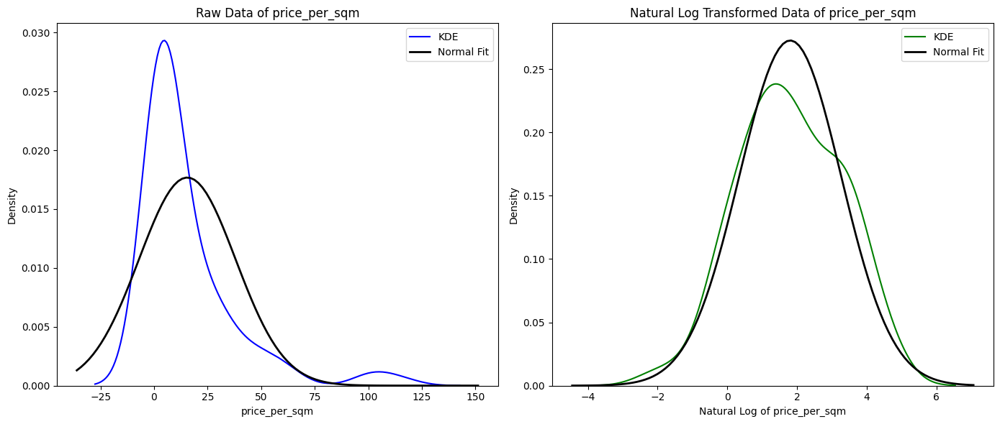


Summary Statistics for price_per_sqm:
count     90.000000
mean      15.504279
std       22.692201
min        0.118334
25%        2.288658
50%        5.662393
75%       22.503807
max      115.036976
Name: price_per_sqm, dtype: float64

Summary Statistics for Natural Log of price_per_sqm:
count    90.000000
mean      1.804959
std       1.471010
min      -2.134242
25%       0.827893
50%       1.733669
75%       3.113296
max       4.745254
Name: price_per_sqm, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.66523, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.98629, p-value=0.46831

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [12]:
# Specify the column of interest
column_of_interest = 'price_per_sqm'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)


Таким образом, можно сделать вывод о логарифмически нормальном распределении удельных цен предложений.

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


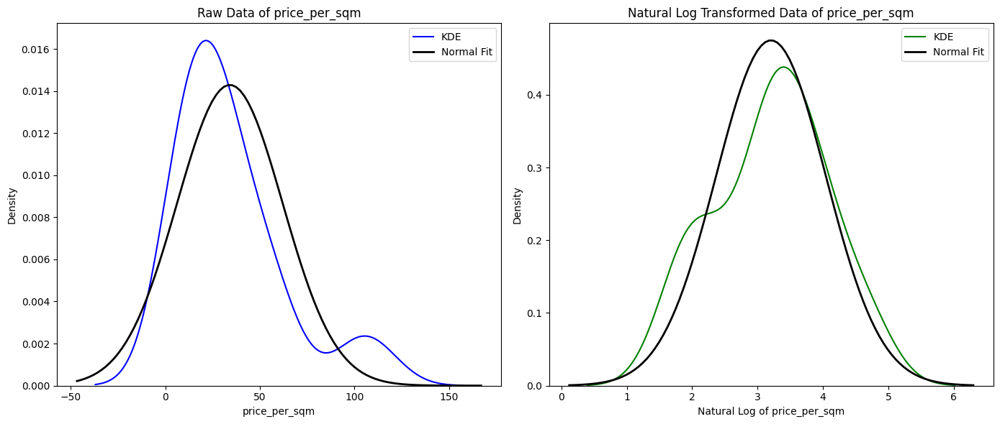


Summary Statistics for price_per_sqm:
count     33.000000
mean      34.169468
std       28.352527
min        5.330056
25%       15.606189
50%       26.041667
75%       46.037690
max      115.036976
Name: price_per_sqm, dtype: float64

Summary Statistics for Natural Log of price_per_sqm:
count    33.000000
mean      3.204622
std       0.852966
min       1.673362
25%       2.747668
50%       3.259698
75%       3.829460
max       4.745254
Name: price_per_sqm, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.83300, p-value=0.00015

Shapiro-Wilk Test for log-transformed data:
Statistic=0.96001, p-value=0.25858

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [15]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


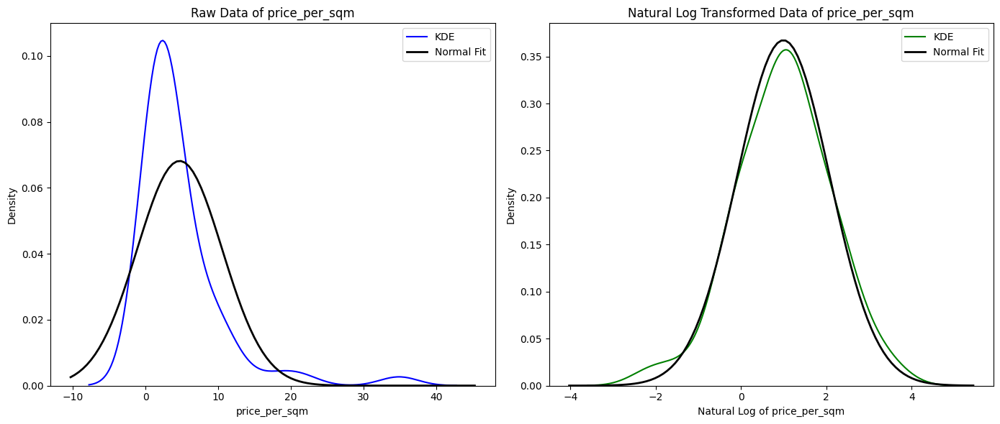


Summary Statistics for price_per_sqm:
count    57.000000
mean      4.698117
std       5.905026
min       0.118334
25%       1.243781
50%       3.000000
75%       5.363636
max      34.883721
Name: price_per_sqm, dtype: float64

Summary Statistics for Natural Log of price_per_sqm:
count    57.000000
mean      0.994628
std       1.095654
min      -2.134242
25%       0.218156
50%       1.098612
75%       1.679642
max       3.552020
Name: price_per_sqm, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.65758, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.98913, p-value=0.88839

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [16]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


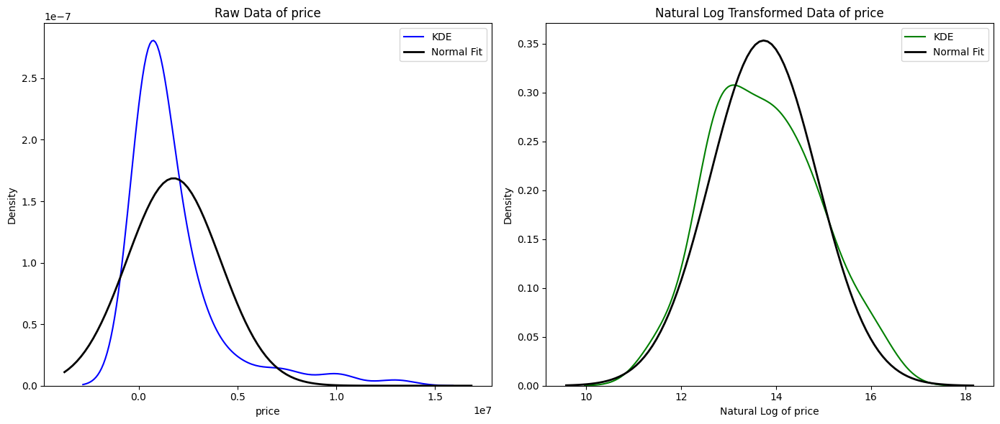


Summary Statistics for price:
count    9.000000e+01
mean     1.769636e+06
std      2.377812e+06
min      8.500000e+04
25%      3.850000e+05
50%      8.500000e+05
75%      2.074250e+06
max      1.300000e+07
Name: price, dtype: float64

Summary Statistics for Natural Log of price:
count    90.000000
mean     13.739659
std       1.135747
min      11.350407
25%      12.860750
50%      13.651259
75%      14.544893
max      16.380460
Name: price, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.66046, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.98387, p-value=0.33030

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [18]:
# Specify the column of interest
column_of_interest = 'price'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


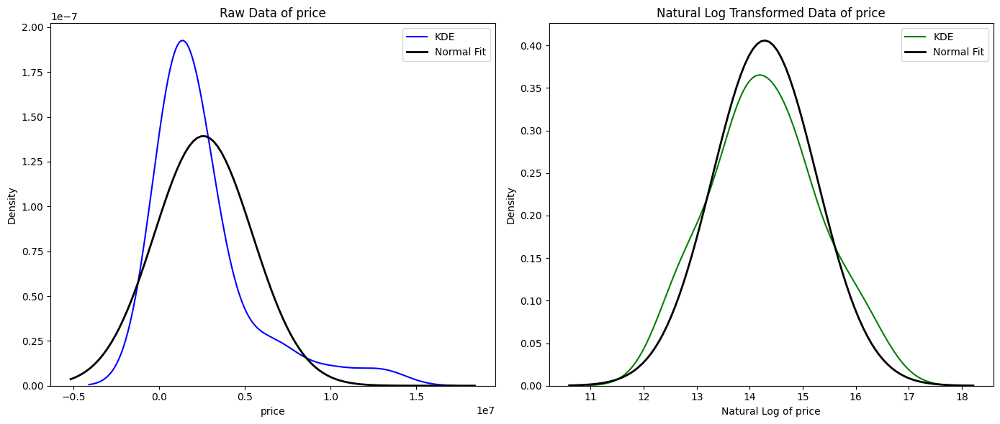


Summary Statistics for price:
count    3.300000e+01
mean     2.581485e+06
std      2.907838e+06
min      2.500000e+05
25%      1.000000e+06
50%      1.500000e+06
75%      2.500000e+06
max      1.300000e+07
Name: price, dtype: float64

Summary Statistics for Natural Log of price:
count    33.000000
mean     14.279569
std       0.998166
min      12.429216
25%      13.815511
50%      14.220976
75%      14.731801
max      16.380460
Name: price, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.72133, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.97554, p-value=0.64607

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [19]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


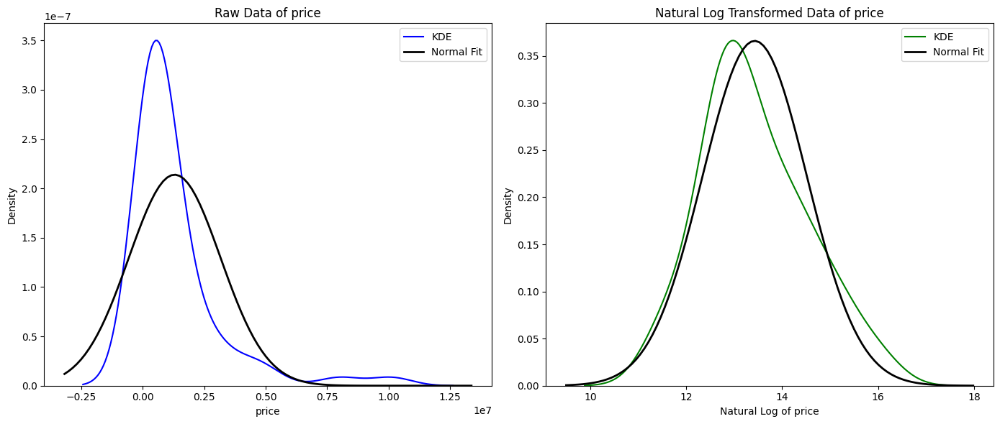


Summary Statistics for price:
count    5.700000e+01
mean     1.299619e+06
std      1.881706e+06
min      8.500000e+04
25%      3.000000e+05
50%      5.900000e+05
75%      1.500000e+06
max      1.010000e+07
Name: price, dtype: float64

Summary Statistics for Natural Log of price:
count    57.000000
mean     13.427079
std       1.099769
min      11.350407
25%      12.611538
50%      13.287878
75%      14.220976
max      16.128046
Name: price, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.61228, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.97165, p-value=0.20004

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [20]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

Таким образом, можно сделать вывод о логарифмически нормальном распределении абсолютных цен предложений.

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


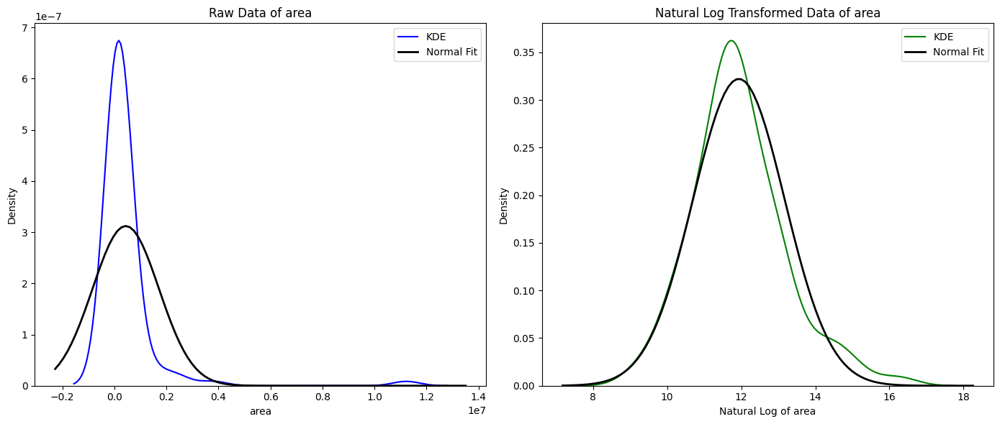


Summary Statistics for area:
count    9.000000e+01
mean     4.370873e+05
std      1.285483e+06
min      9.897000e+03
25%      7.097500e+04
50%      1.380000e+05
75%      3.072402e+05
max      1.121776e+07
Name: area, dtype: float64

Summary Statistics for Natural Log of area:
count    90.000000
mean     11.934699
std       1.245553
min       9.199987
25%      11.169805
50%      11.834904
75%      12.632643
max      16.233009
Name: area, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.29043, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.96476, p-value=0.01529

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [21]:
# Specify the column of interest
column_of_interest = 'area'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


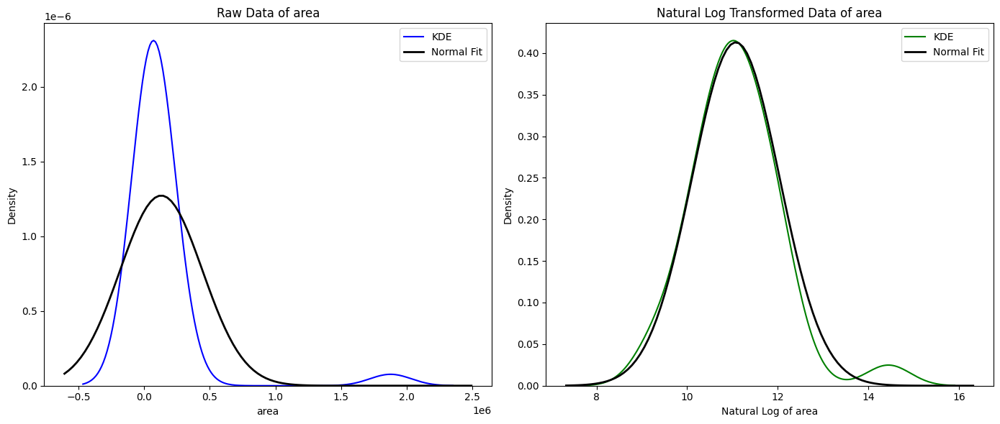


Summary Statistics for area:
count    3.300000e+01
mean     1.308797e+05
std      3.183250e+05
min      9.897000e+03
25%      3.258200e+04
50%      6.252400e+04
75%      9.600000e+04
max      1.876153e+06
Name: area, dtype: float64

Summary Statistics for Natural Log of area:
count    33.000000
mean     11.074948
std       0.981190
min       9.199987
25%      10.391515
50%      11.043306
75%      11.472103
max      14.444734
Name: area, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.30265, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.93509, p-value=0.04896

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [22]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


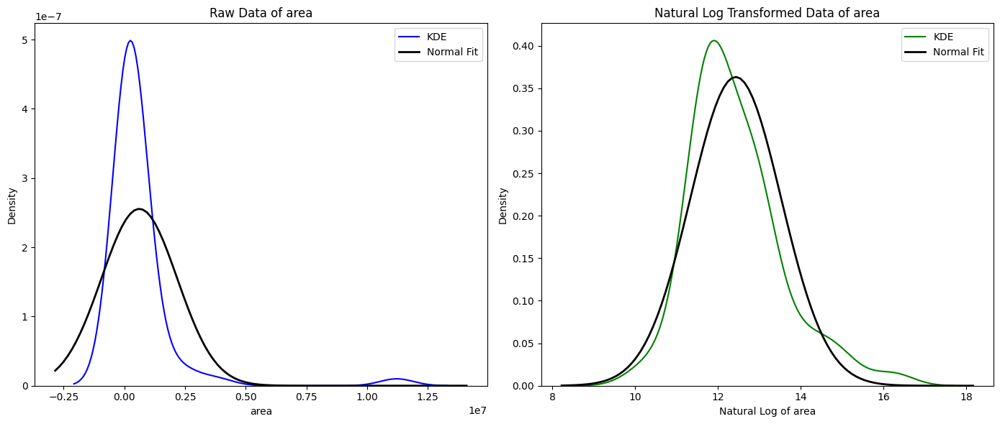


Summary Statistics for area:
count    5.700000e+01
mean     6.143654e+05
std      1.575149e+06
min      2.580000e+04
25%      1.200000e+05
50%      1.900000e+05
75%      4.080000e+05
max      1.121776e+07
Name: area, dtype: float64

Summary Statistics for Natural Log of area:
count    57.000000
mean     12.432451
std       1.108027
min      10.158130
25%      11.695247
50%      12.154779
75%      12.919022
max      16.233009
Name: area, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.33316, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.92107, p-value=0.00118

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [23]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


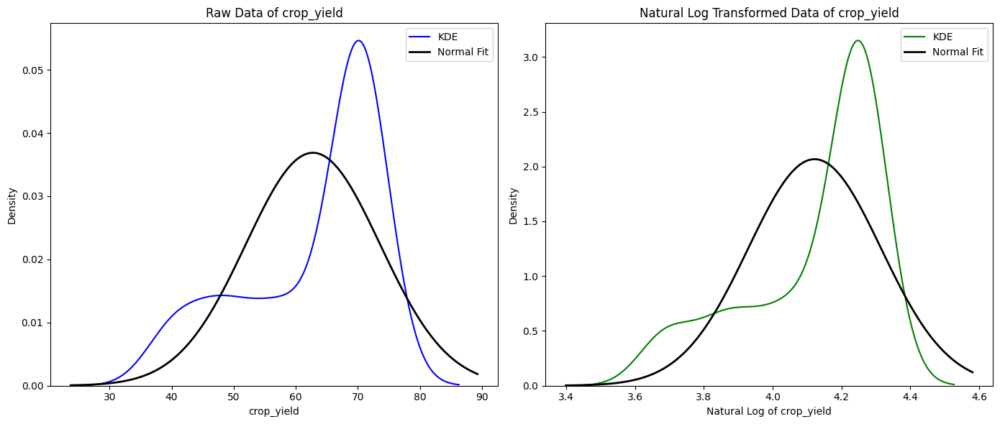


Summary Statistics for crop_yield:
count    90.000000
mean     62.755556
std      10.876540
min      40.000000
25%      55.250000
50%      70.000000
75%      70.000000
max      73.000000
Name: crop_yield, dtype: float64

Summary Statistics for Natural Log of crop_yield:
count    90.000000
mean      4.121991
std       0.194022
min       3.688879
25%       4.011838
50%       4.248495
75%       4.248495
max       4.290459
Name: crop_yield, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.77375, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.75352, p-value=0.00000

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [24]:
# Specify the column of interest
column_of_interest = 'crop_yield'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


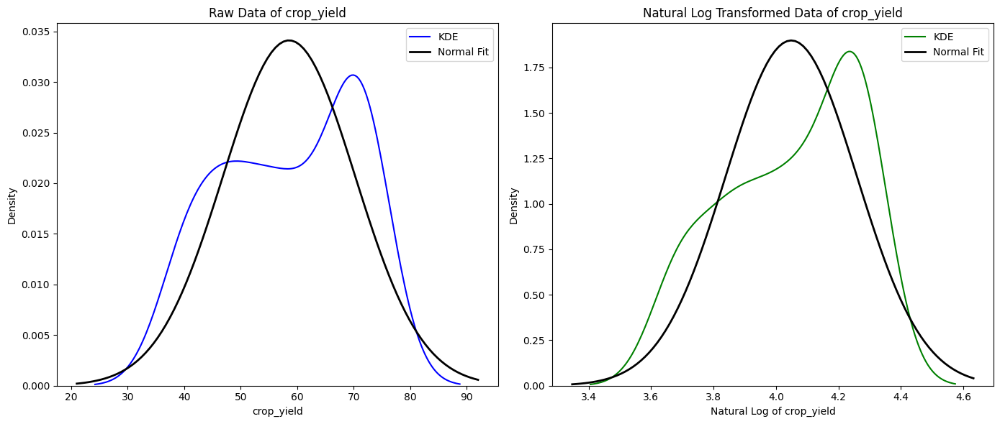


Summary Statistics for crop_yield:
count    57.000000
mean     58.561404
std      11.797423
min      40.000000
25%      49.000000
50%      59.000000
75%      71.000000
max      73.000000
Name: crop_yield, dtype: float64

Summary Statistics for Natural Log of crop_yield:
count    57.000000
mean      4.048752
std       0.211986
min       3.688879
25%       3.891820
50%       4.077537
75%       4.262680
max       4.290459
Name: crop_yield, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.88813, p-value=0.00007

Shapiro-Wilk Test for log-transformed data:
Statistic=0.87934, p-value=0.00004

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [26]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

Data contains zero or negative values. Shifting data by 2.0 to make all values positive.


/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


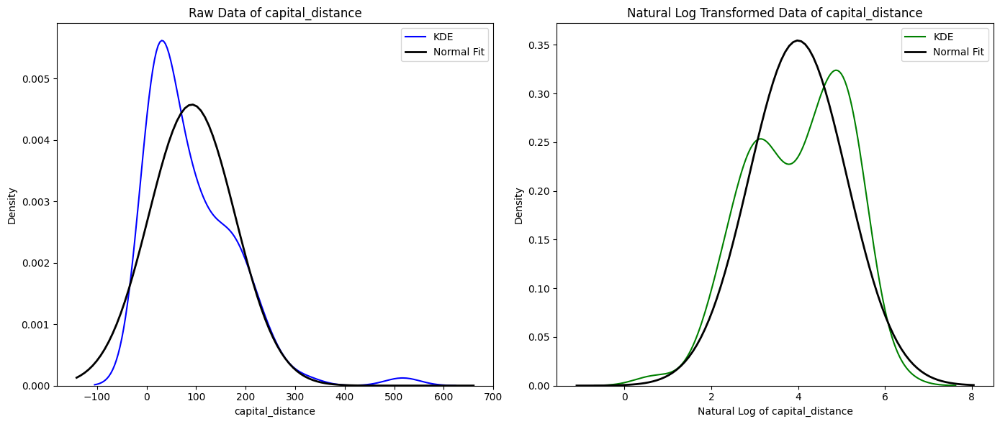


Summary Statistics for capital_distance:
count     90.000000
mean      91.544444
std       87.616909
min        2.000000
25%       22.000000
50%       66.500000
75%      149.750000
max      517.000000
Name: capital_distance, dtype: float64

Summary Statistics for Natural Log of capital_distance:
count    90.000000
mean      3.994863
std       1.131995
min       0.693147
25%       3.091042
50%       4.197174
75%       5.008963
max       6.248043
Name: capital_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.83292, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.95996, p-value=0.00726

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [13]:
# Specify the column of interest
column_of_interest = 'capital_distance'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

Data contains zero or negative values. Shifting data by 2.0 to make all values positive.


/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


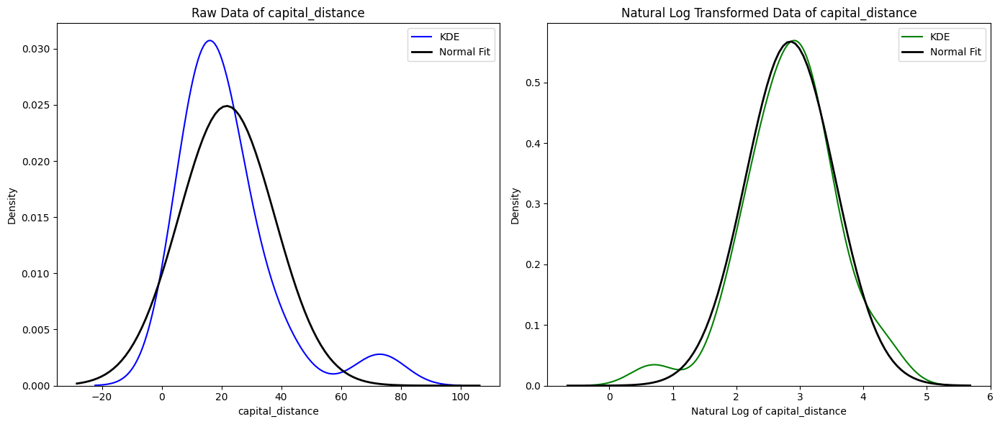


Summary Statistics for capital_distance:
count    33.000000
mean     21.787879
std      16.266833
min       2.000000
25%      12.000000
50%      20.000000
75%      25.000000
max      76.000000
Name: capital_distance, dtype: float64

Summary Statistics for Natural Log of capital_distance:
count    33.000000
mean      2.850186
std       0.713711
min       0.693147
25%       2.484907
50%       2.995732
75%       3.218876
max       4.330733
Name: capital_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.79577, p-value=0.00003

Shapiro-Wilk Test for log-transformed data:
Statistic=0.96421, p-value=0.33839

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [14]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


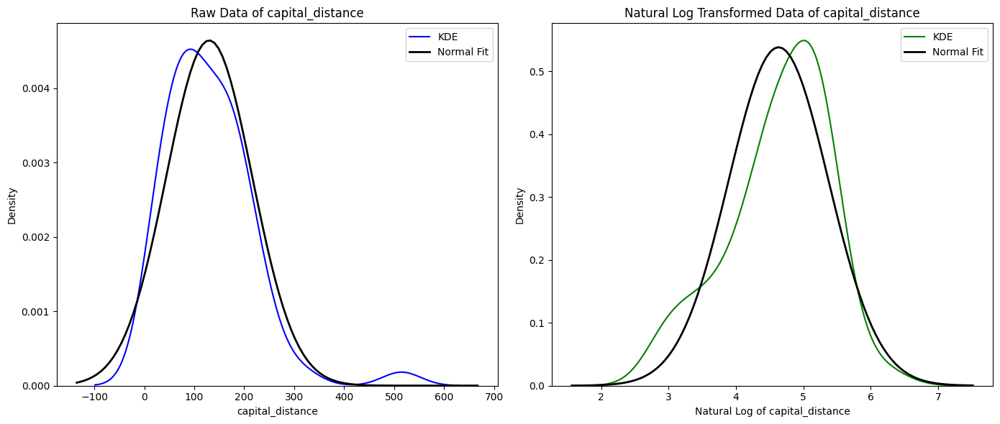


Summary Statistics for capital_distance:
count     57.000000
mean     129.929825
std       86.727994
min       17.000000
25%       65.000000
50%      111.000000
75%      186.000000
max      515.000000
Name: capital_distance, dtype: float64

Summary Statistics for Natural Log of capital_distance:
count    57.000000
mean      4.631668
std       0.747517
min       2.833213
25%       4.174387
50%       4.709530
75%       5.225747
max       6.244167
Name: capital_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.87905, p-value=0.00004

Shapiro-Wilk Test for log-transformed data:
Statistic=0.94987, p-value=0.01941

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [15]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


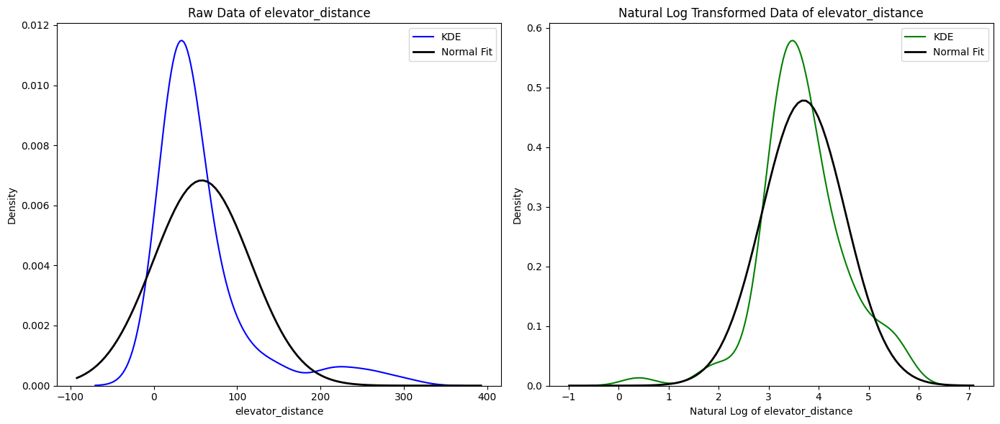


Summary Statistics for elevator_distance:
count     90.000000
mean      57.655556
std       58.705590
min        1.500000
25%       25.000000
50%       37.000000
75%       57.750000
max      299.000000
Name: elevator_distance, dtype: float64

Summary Statistics for Natural Log of elevator_distance:
count    90.000000
mean      3.701765
std       0.838575
min       0.405465
25%       3.218876
50%       3.610918
75%       4.056095
max       5.700444
Name: elevator_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.68008, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.93874, p-value=0.00036

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [16]:
# Specify the column of interest
column_of_interest = 'elevator_distance'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


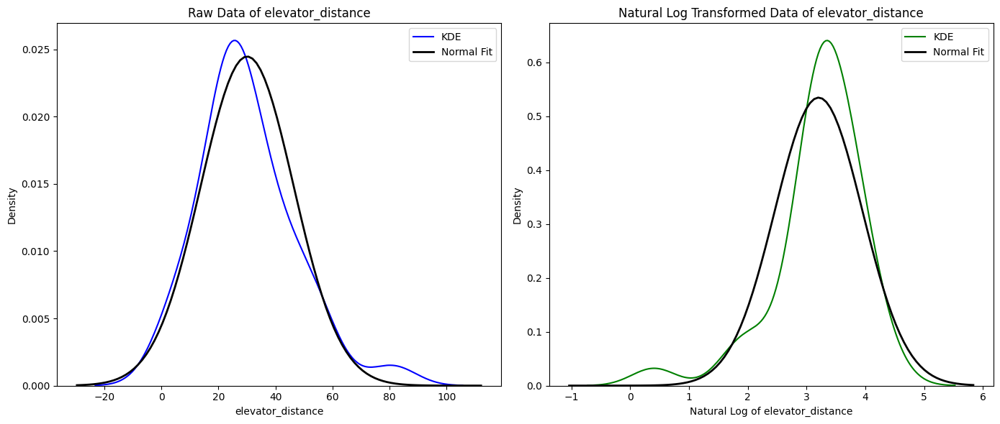


Summary Statistics for elevator_distance:
count    33.000000
mean     30.090909
std      16.552216
min       1.500000
25%      23.000000
50%      25.000000
75%      36.000000
max      81.000000
Name: elevator_distance, dtype: float64

Summary Statistics for Natural Log of elevator_distance:
count    33.000000
mean      3.205156
std       0.757412
min       0.405465
25%       3.135494
50%       3.218876
75%       3.583519
max       4.394449
Name: elevator_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.94361, p-value=0.08658

Shapiro-Wilk Test for log-transformed data:
Statistic=0.84923, p-value=0.00033

Raw data looks normally distributed (fail to reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [17]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


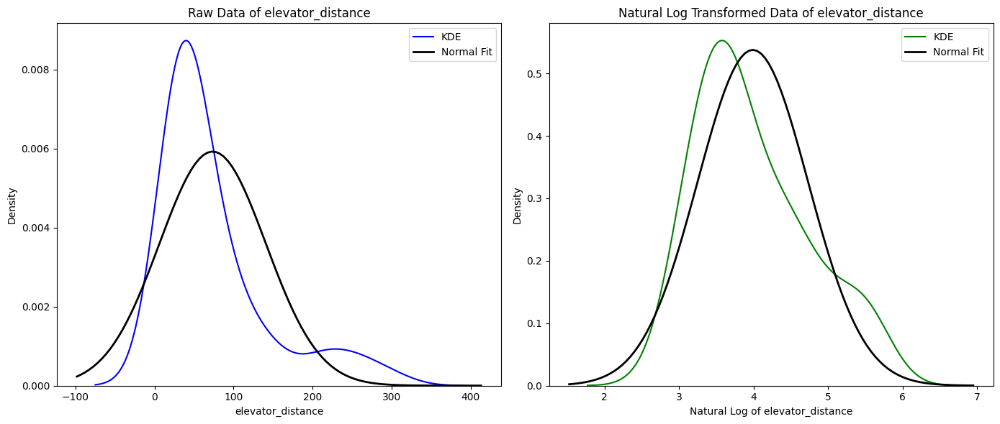


Summary Statistics for elevator_distance:
count     57.000000
mean      73.614035
std       67.924263
min       16.000000
25%       32.000000
50%       44.000000
75%       85.000000
max      299.000000
Name: elevator_distance, dtype: float64

Summary Statistics for Natural Log of elevator_distance:
count    57.000000
mean      3.989276
std       0.748543
min       2.772589
25%       3.465736
50%       3.784190
75%       4.442651
max       5.700444
Name: elevator_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.73677, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.93317, p-value=0.00364

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [18]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

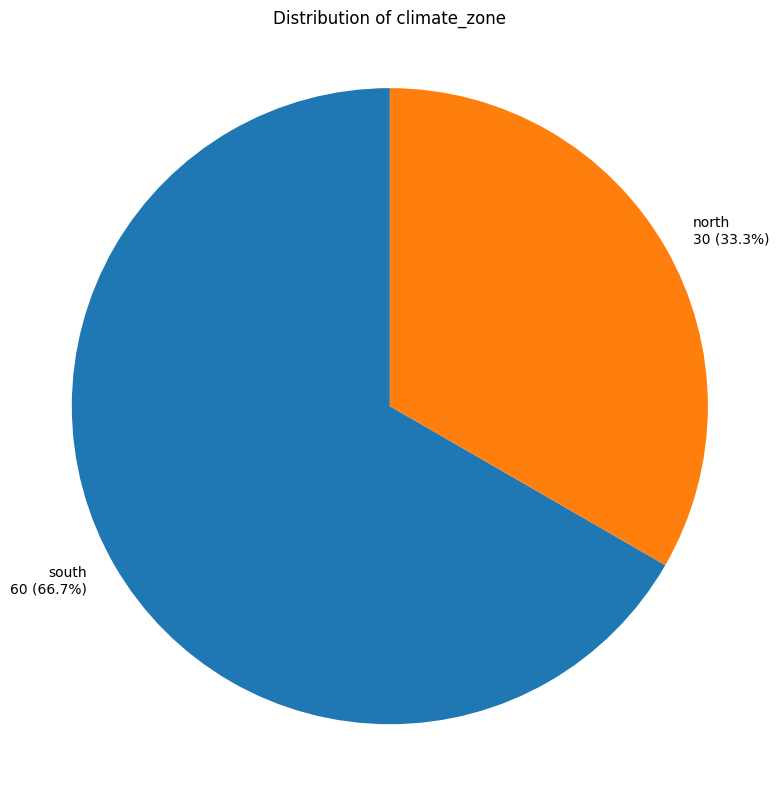

In [20]:
# Specify the column you want to visualize
column_to_visualize = 'climate_zone'

# Call the function
plot_pie_chart(df, column=column_to_visualize)


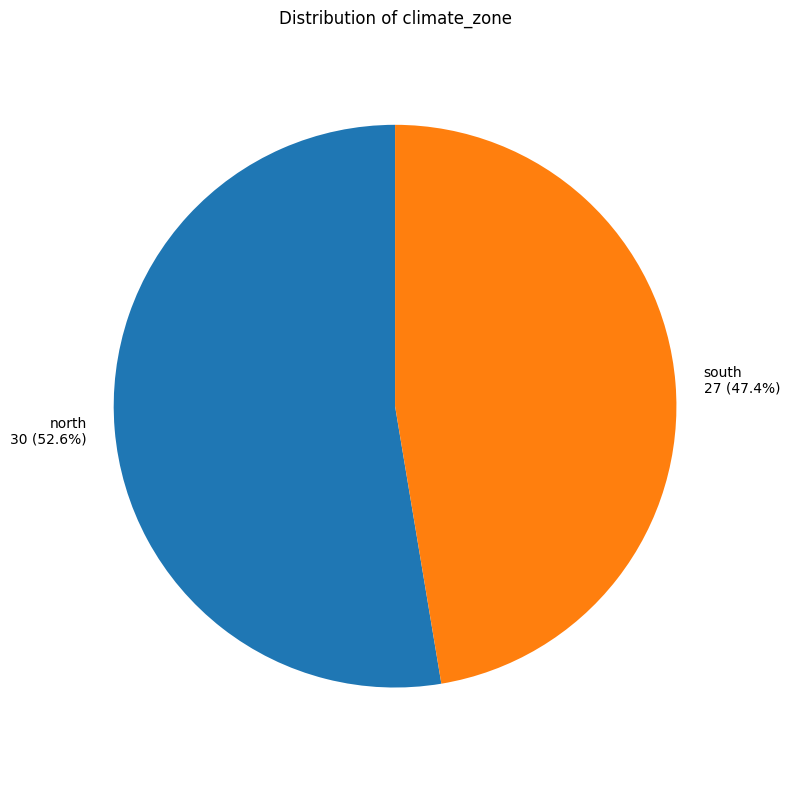

In [21]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)


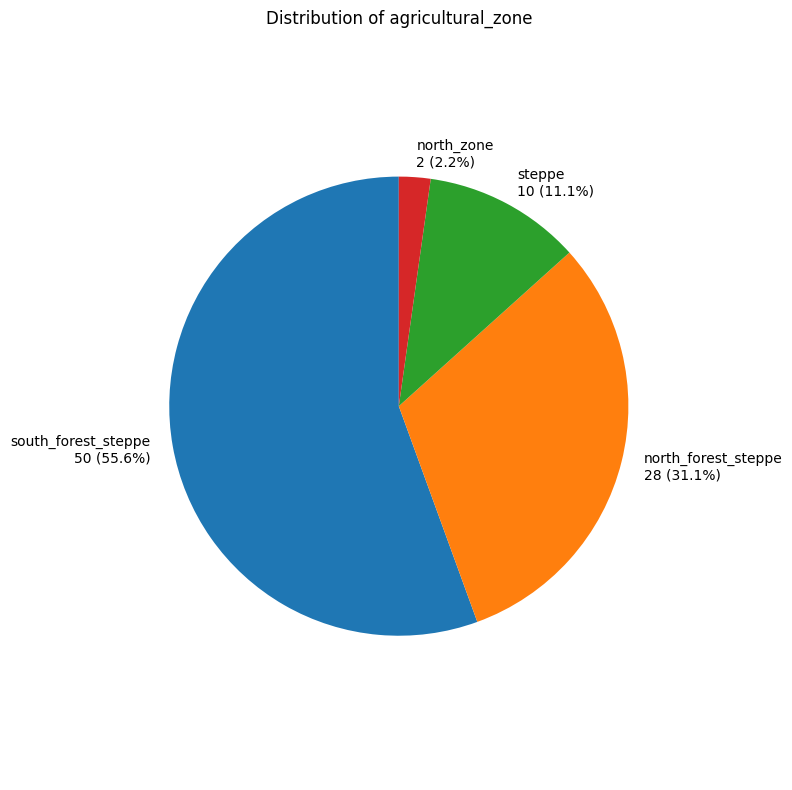

In [22]:
# Specify the column you want to visualize
column_to_visualize = 'agricultural_zone'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

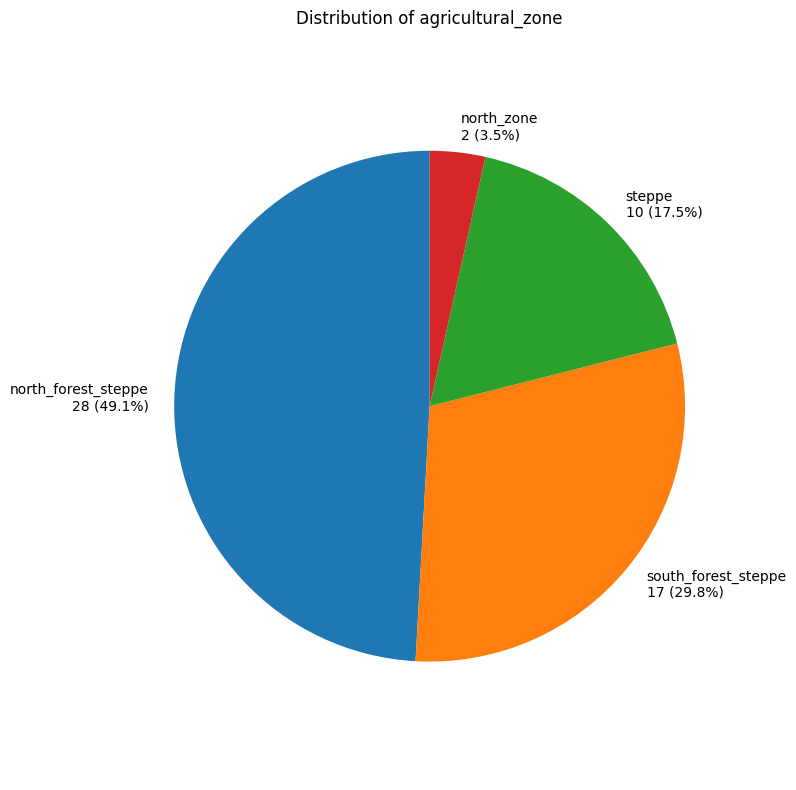

In [23]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)


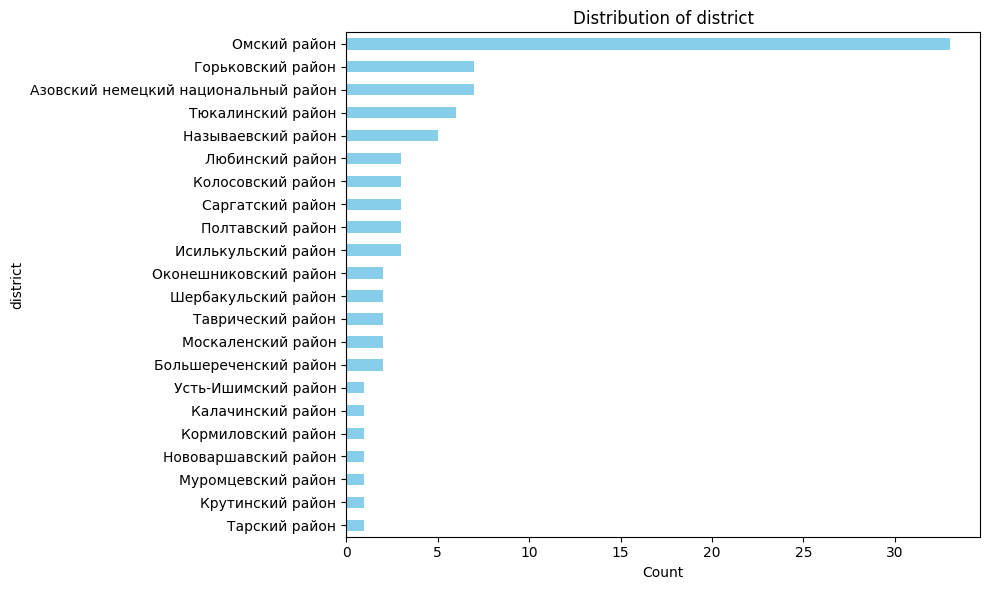

In [25]:
# Specify the column you want to visualize
column_to_visualize = 'district'

# Call the function
plot_bar_chart(df, column=column_to_visualize)

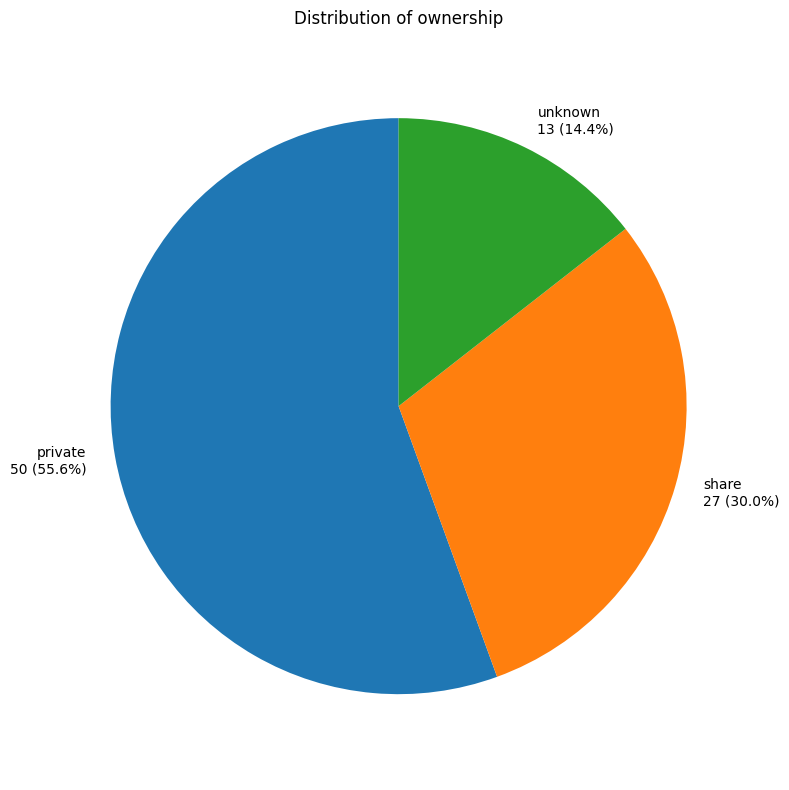

In [26]:
# Specify the column you want to visualize
column_to_visualize = 'ownership'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

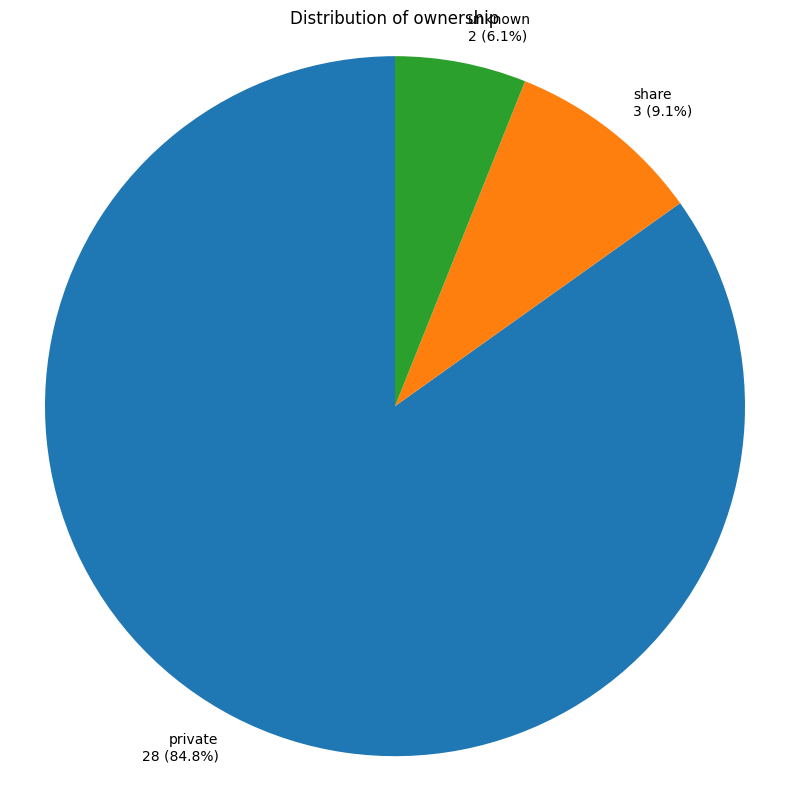

In [27]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

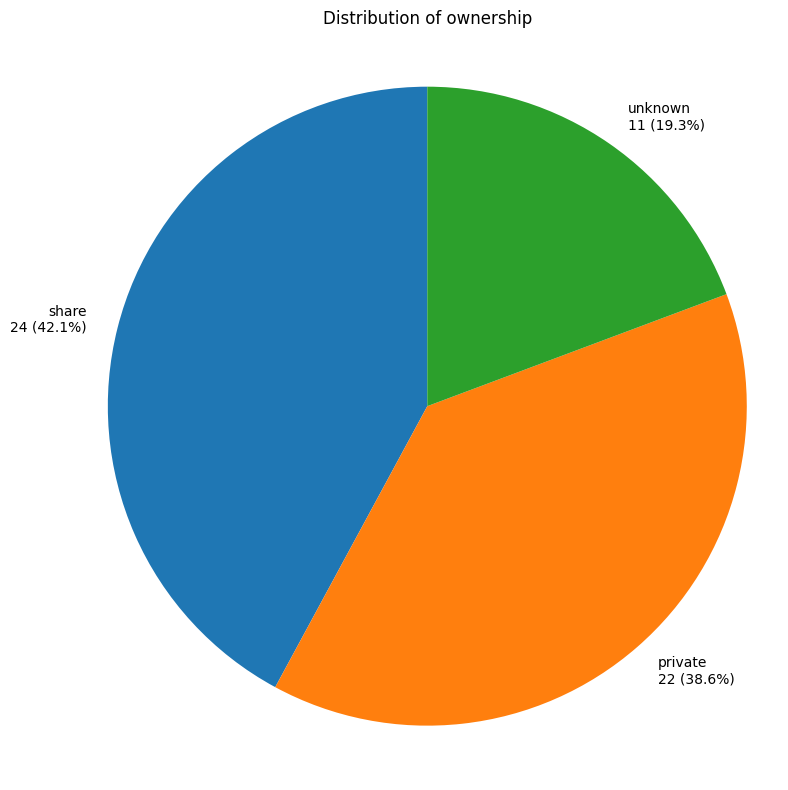

In [28]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

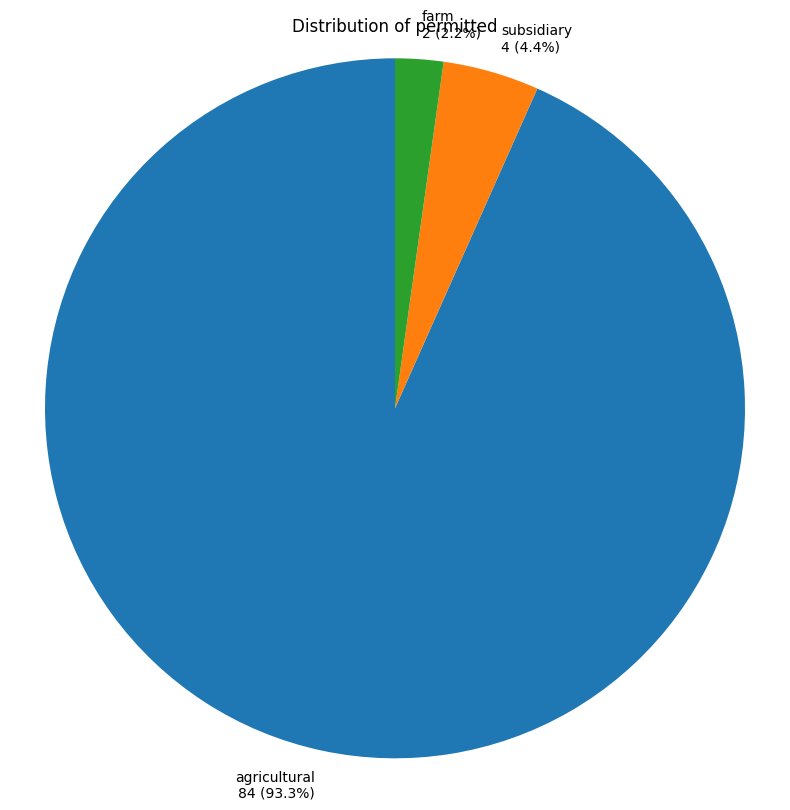

In [29]:
# Specify the column you want to visualize
column_to_visualize = 'permitted'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

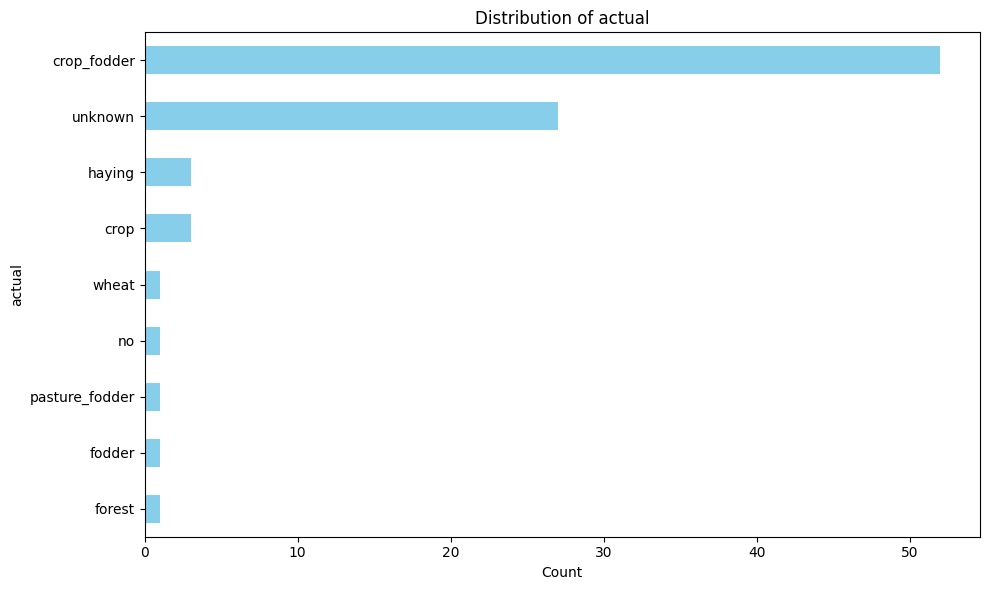

In [30]:
# Specify the column you want to visualize
column_to_visualize = 'actual'

# Call the function
plot_bar_chart(df, column=column_to_visualize)

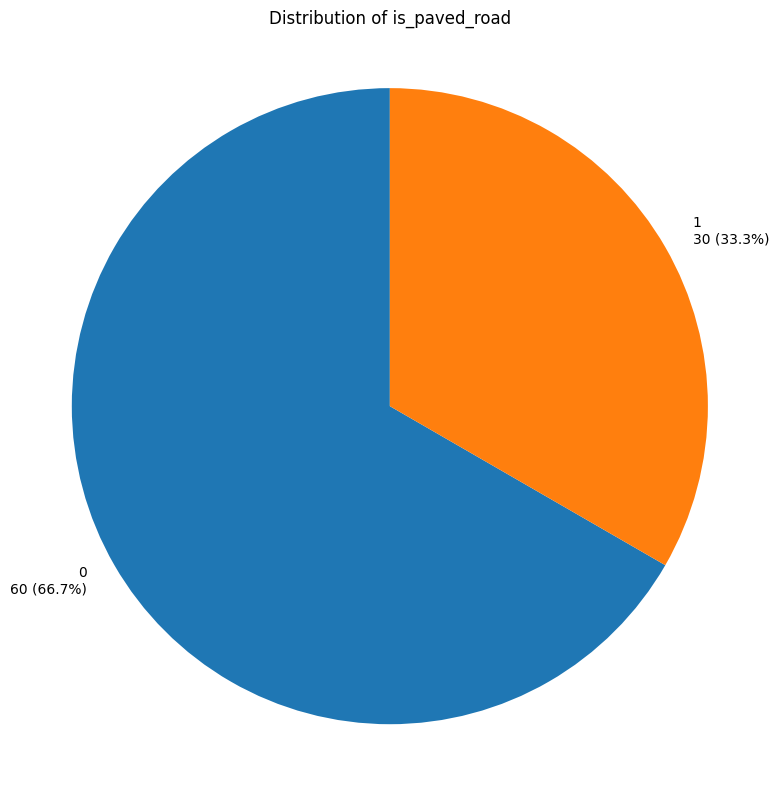

In [31]:
# Specify the column you want to visualize
column_to_visualize = 'is_paved_road'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

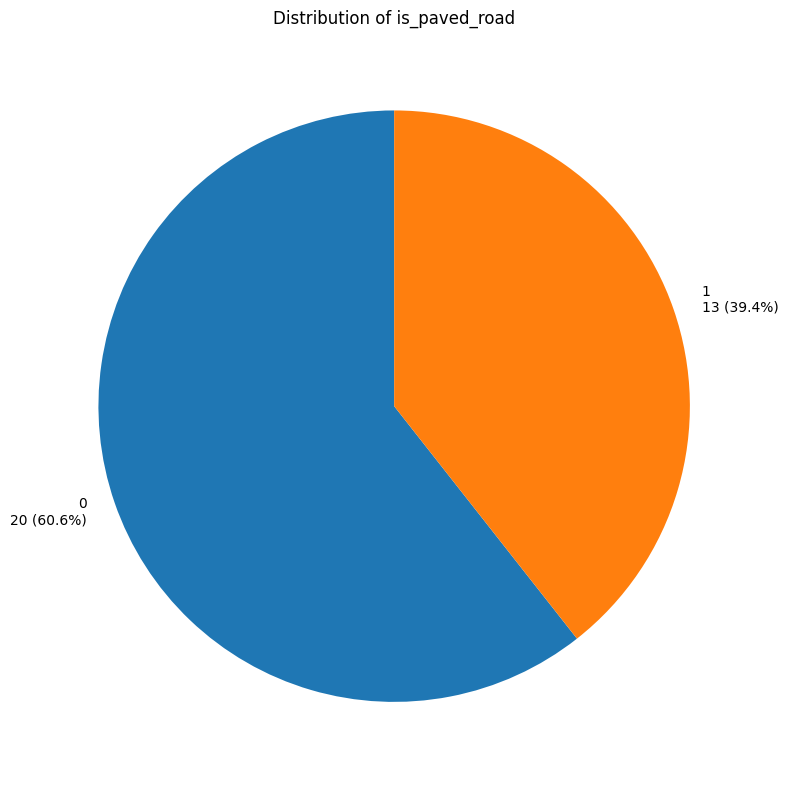

In [32]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

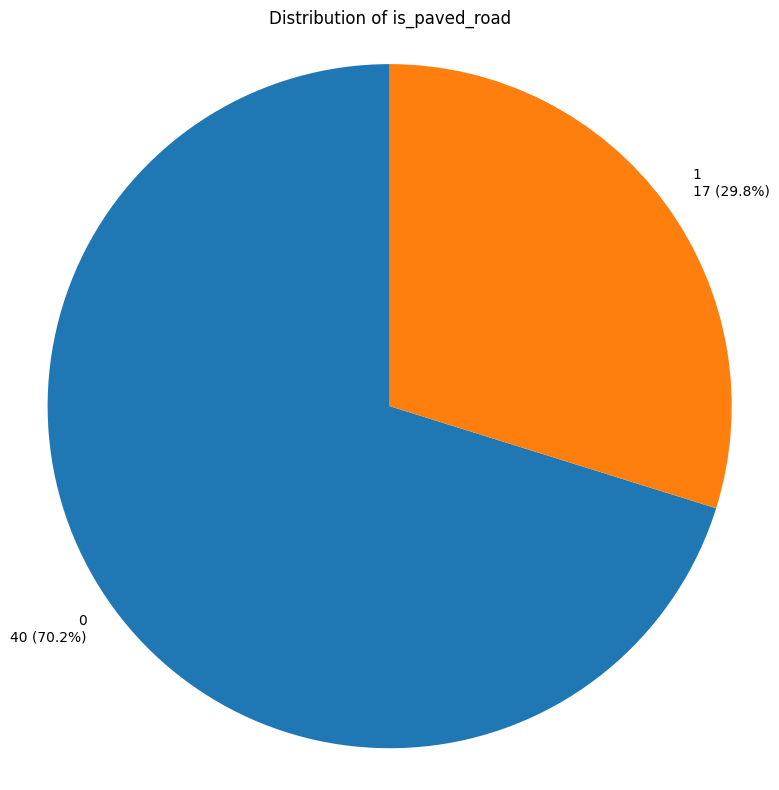

In [33]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

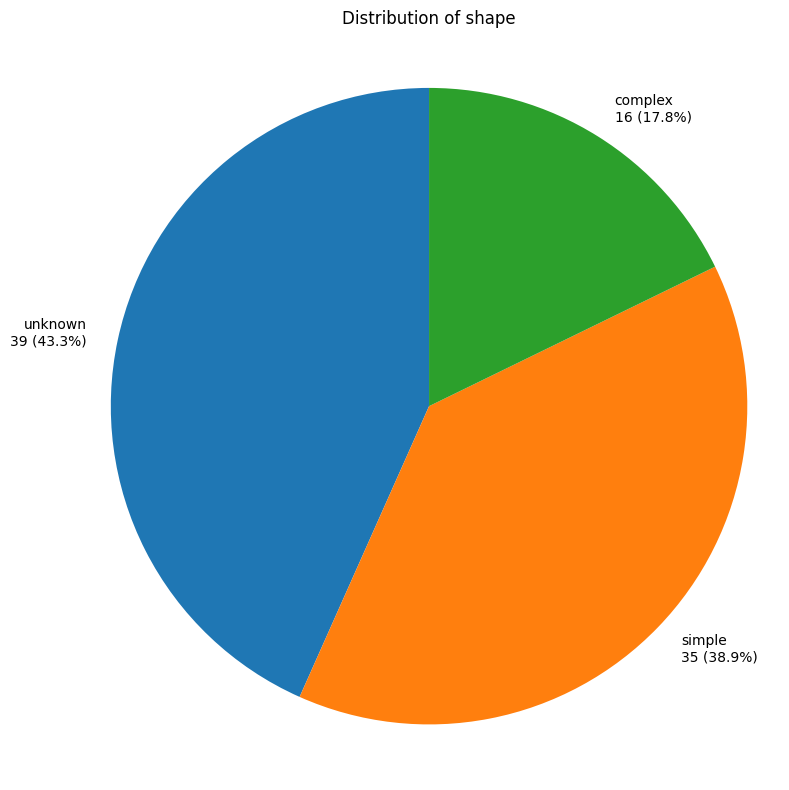

In [34]:
# Specify the column you want to visualize
column_to_visualize = 'shape'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

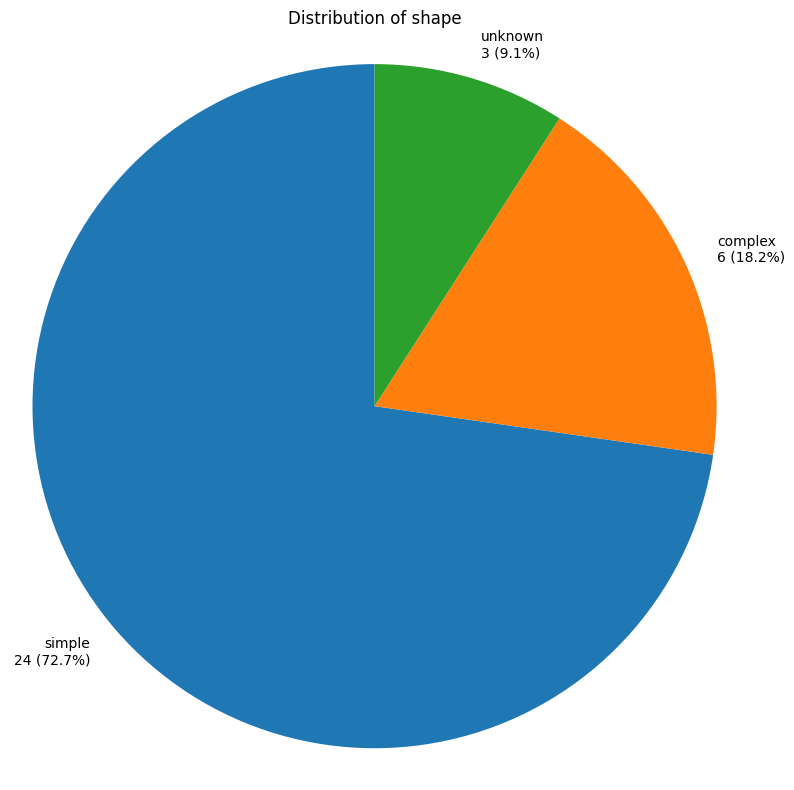

In [35]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

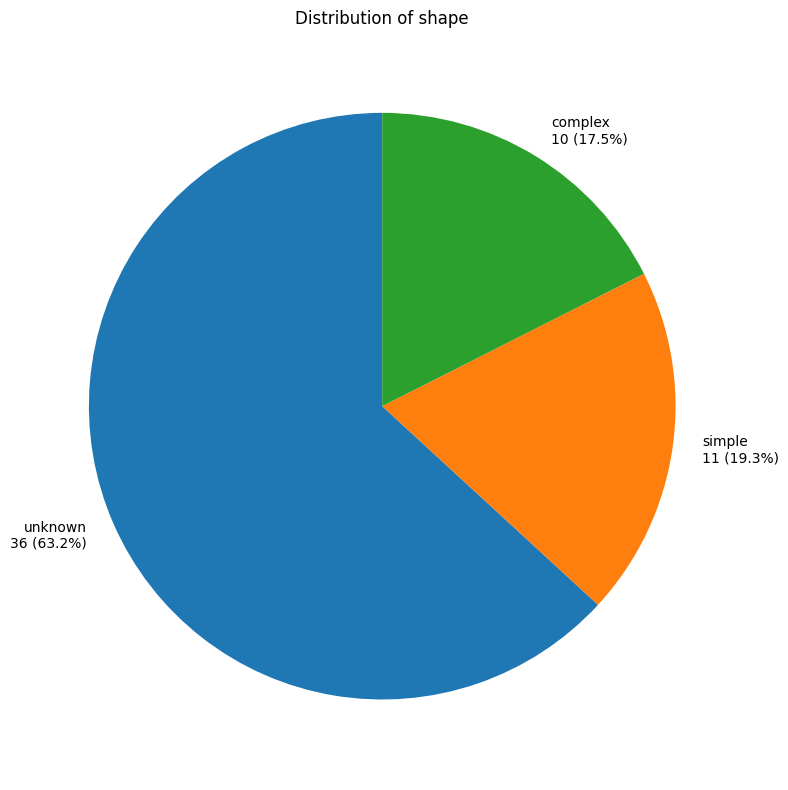

In [36]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

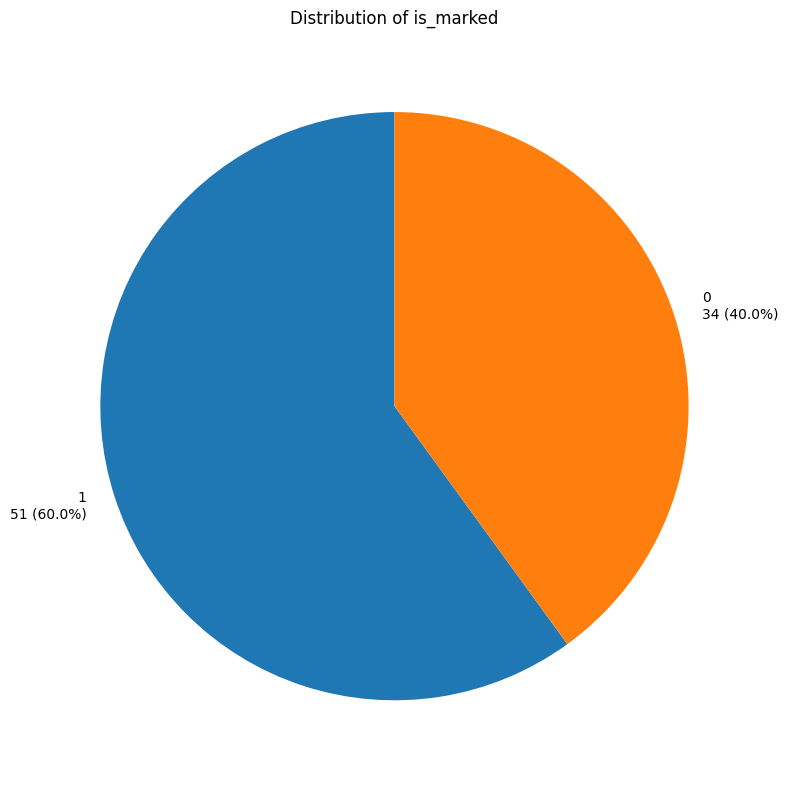

In [15]:
# Specify the column you want to visualize
column_to_visualize = 'is_marked'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

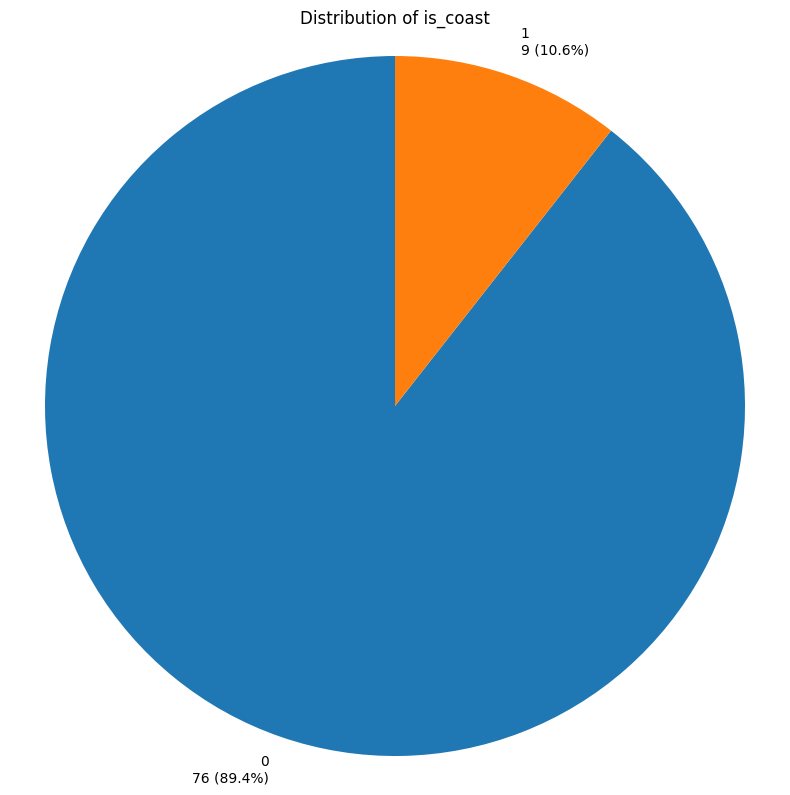

In [16]:
# Specify the column you want to visualize
column_to_visualize = 'is_coast'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

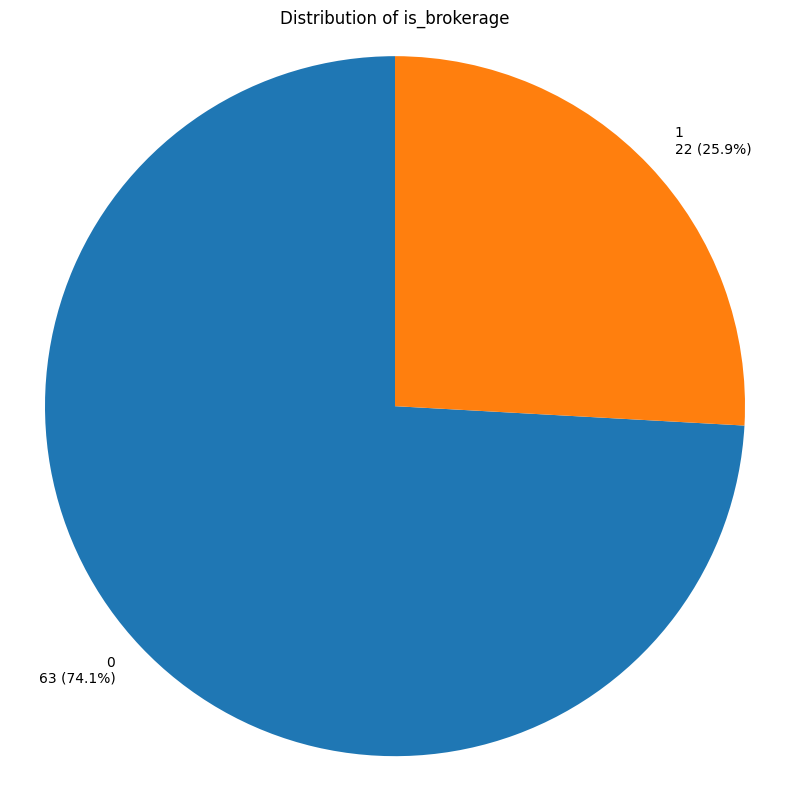

In [17]:
# Specify the column you want to visualize
column_to_visualize = 'is_brokerage'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

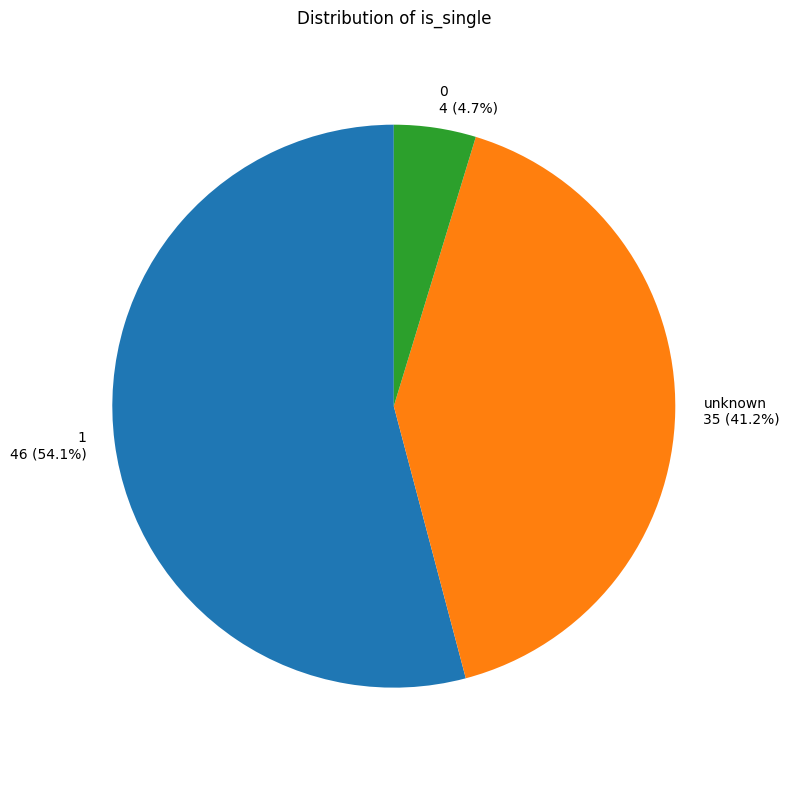

In [18]:
# Specify the column you want to visualize
column_to_visualize = 'is_single'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

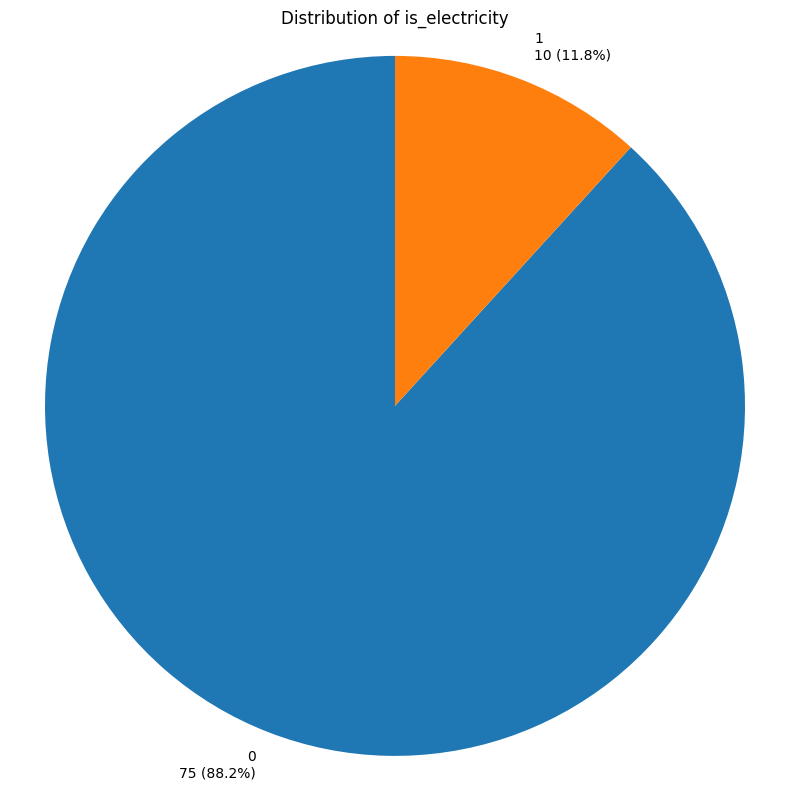

In [19]:
# Specify the column you want to visualize
column_to_visualize = 'is_electricity'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

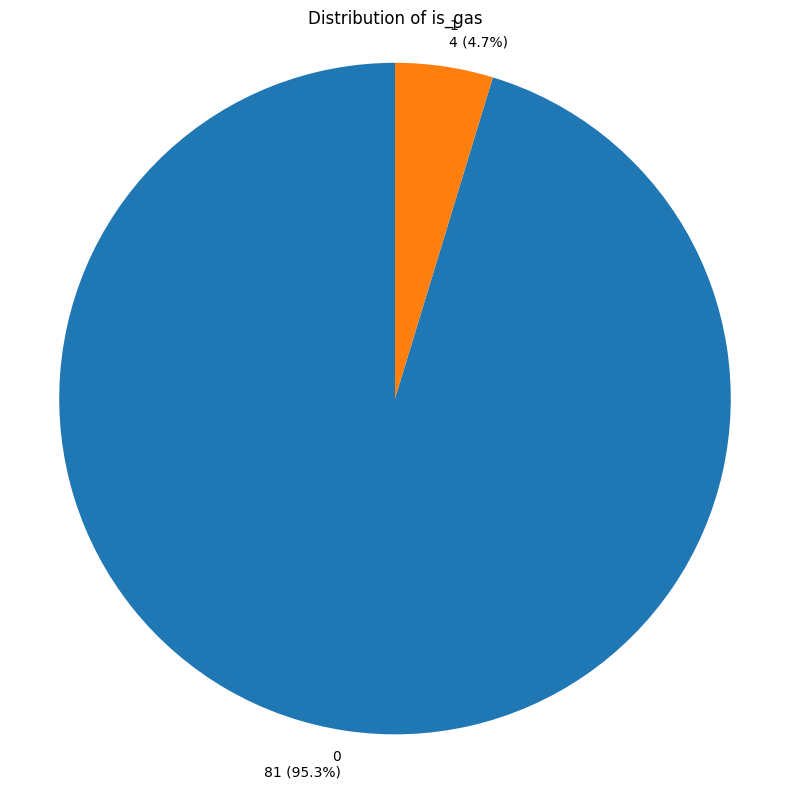

In [20]:
# Specify the column you want to visualize
column_to_visualize = 'is_gas'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

## Изолированный анализ

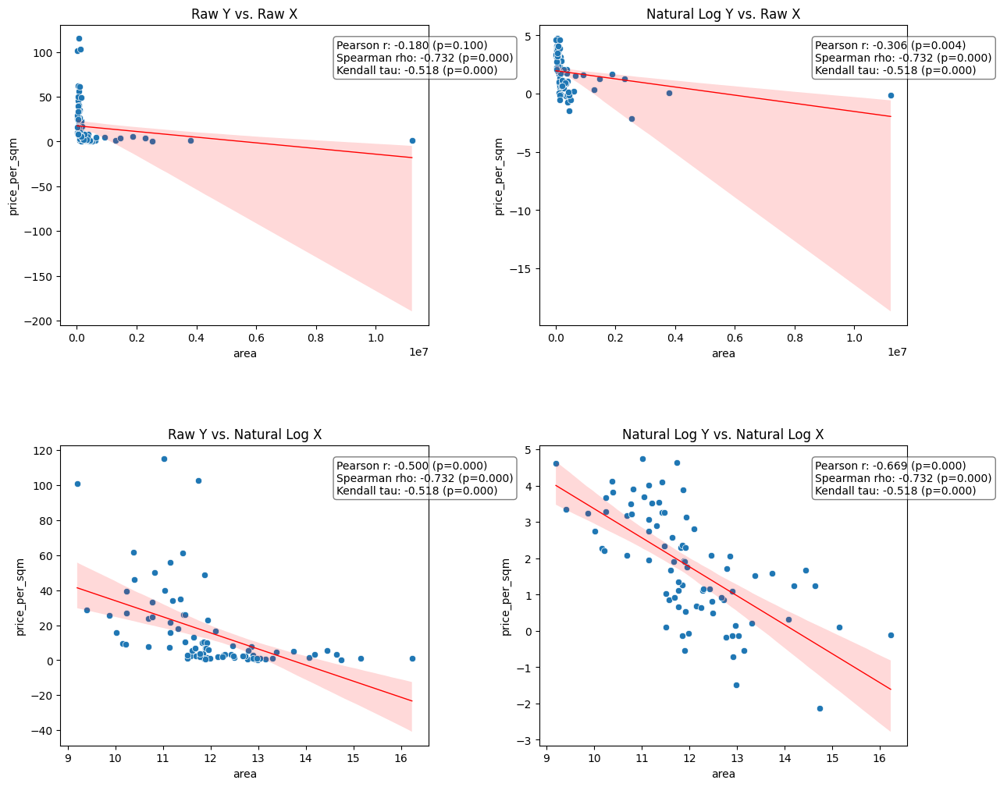

In [3]:
# Specify the columns
price_column = 'price_per_sqm'  # Your price per sqm column
variable_column = 'area'        # The variable you want to analyze (e.g., 'area')

# Call the function
plot_isolated_analysis(df, price_column=price_column, variable_column=variable_column, log_base=np.e)


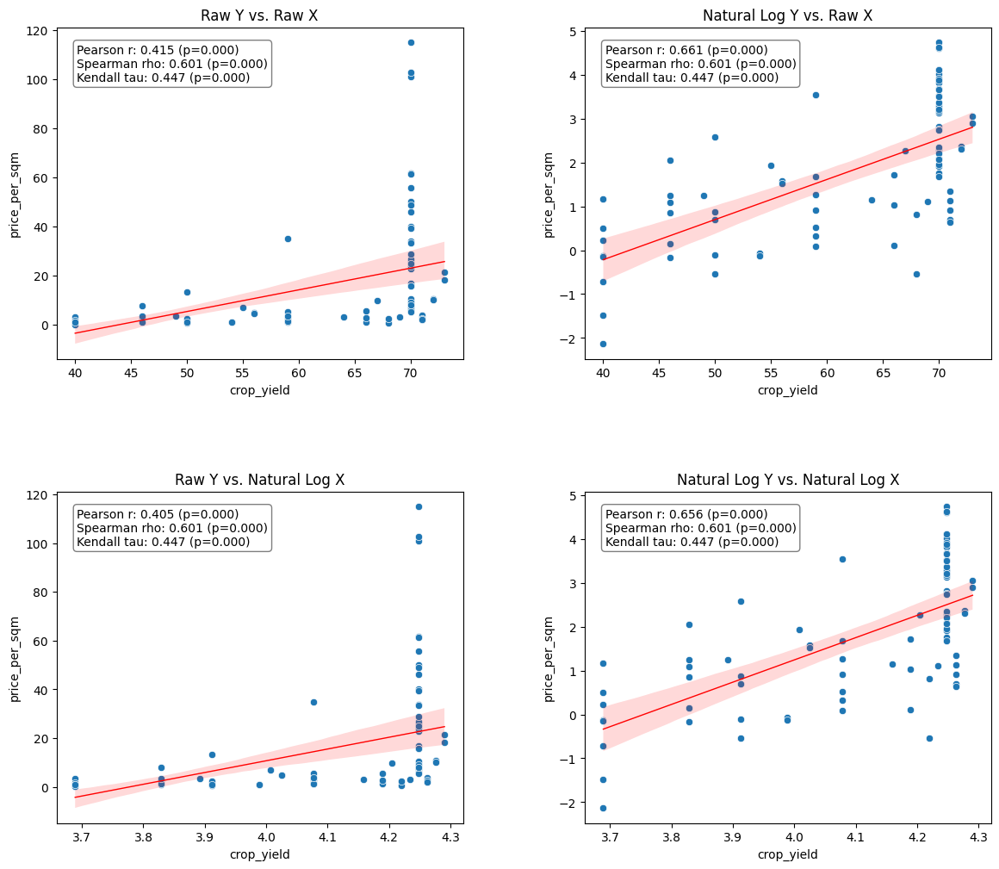

In [5]:
# Specify the columns
price_column = 'price_per_sqm'  # Your price per sqm column
variable_column = 'crop_yield'        # The variable you want to analyze (e.g., 'area')

# Call the function
plot_isolated_analysis(df, price_column=price_column, variable_column=variable_column, log_base=np.e)

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.


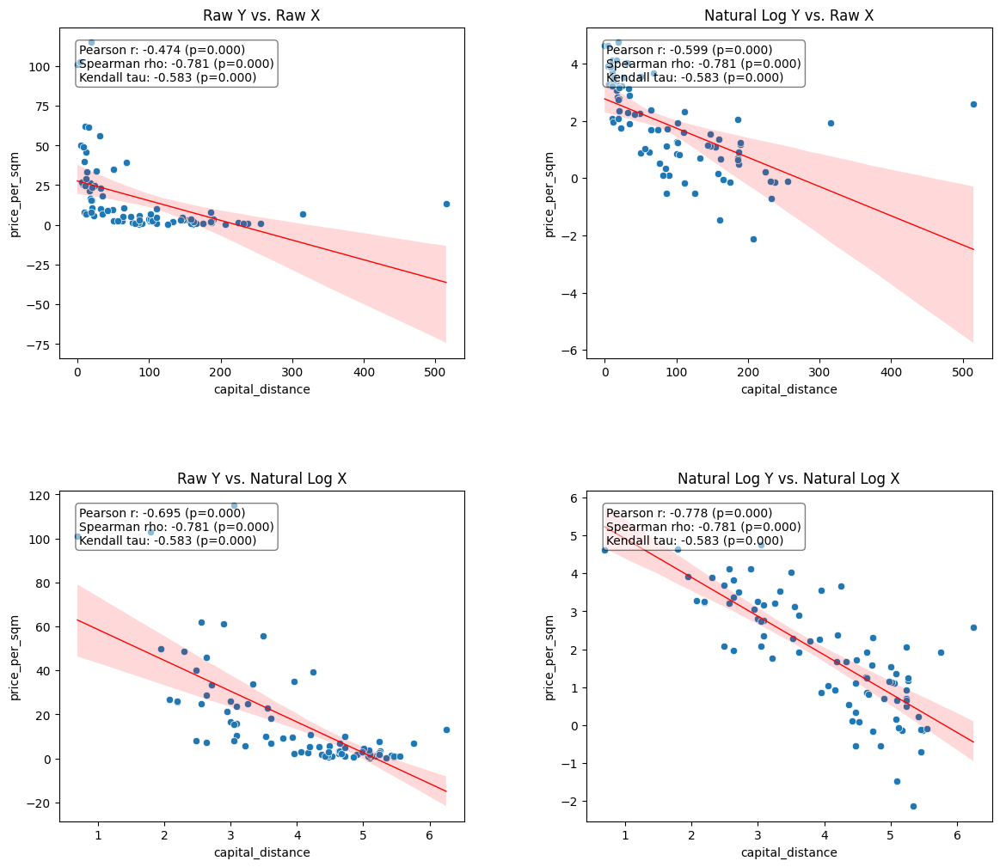

In [6]:
# Specify the columns
price_column = 'price_per_sqm'  # Your price per sqm column
variable_column = 'capital_distance'        # The variable you want to analyze (e.g., 'area')

# Call the function
plot_isolated_analysis(df, price_column=price_column, variable_column=variable_column, log_base=np.e)

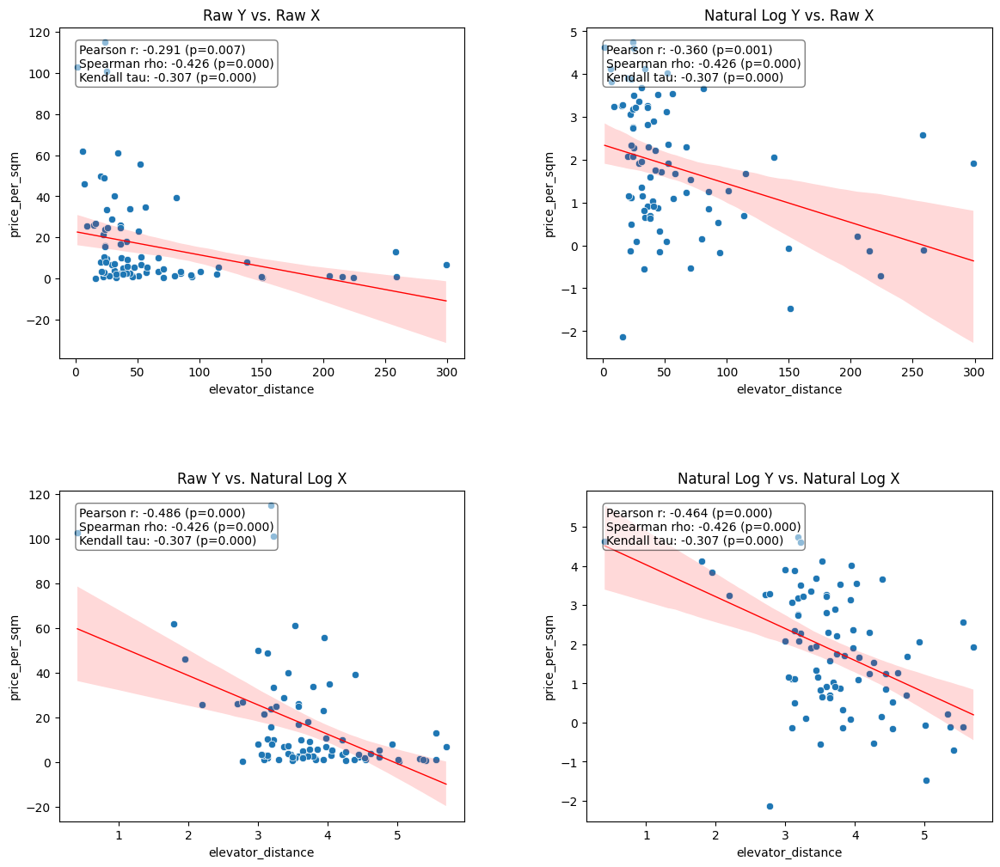

In [7]:
# Specify the columns
price_column = 'price_per_sqm'  # Your price per sqm column
variable_column = 'elevator_distance'        # The variable you want to analyze (e.g., 'area')

# Call the function
plot_isolated_analysis(df, price_column=price_column, variable_column=variable_column, log_base=np.e)

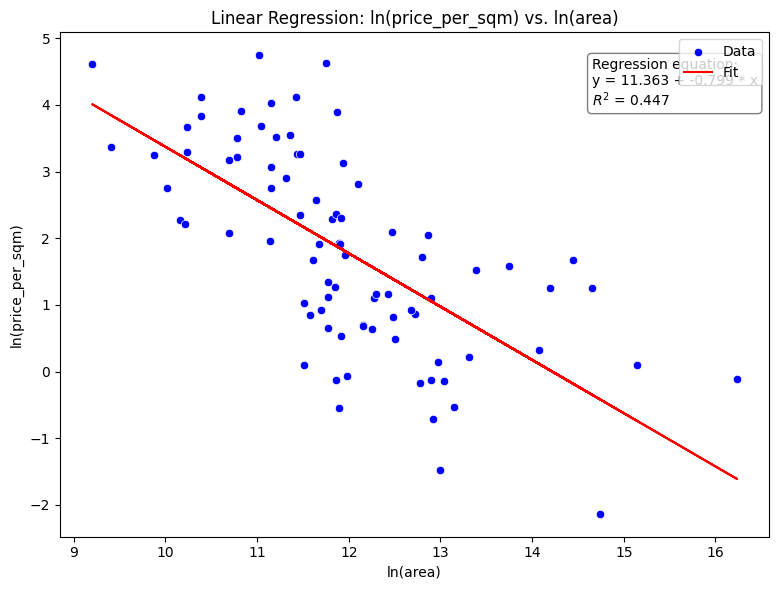

In [4]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df, y_column='price_per_sqm', x_column='area', use_log_y=True, use_log_x=True)

In [5]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df, y_column, x_column, use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.447
Model:                            OLS   Adj. R-squared:                  0.440
Method:                 Least Squares   F-statistic:                     67.08
Date:                Fri, 01 Nov 2024   Prob (F-statistic):           2.72e-12
Time:                        10:26:55   Log-Likelihood:                -129.99
No. Observations:                  85   AIC:                             264.0
Df Residuals:                      83   BIC:                             268.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.3629      1.172      9.691      0.0

In [4]:
# Import the function from your module
from syvajarvirus55a243 import perform_linear_regression

# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable
df_filtered = df[df['district'] == 'Омский район'] # Filter the DataFrame for the specific district

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.172
Model:                            OLS   Adj. R-squared:                  0.145
Method:                 Least Squares   F-statistic:                     6.434
Date:                Thu, 31 Oct 2024   Prob (F-statistic):             0.0164
Time:                        19:55:25   Log-Likelihood:                -37.957
No. Observations:                  33   AIC:                             79.91
Df Residuals:                      31   BIC:                             82.91
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.1961      1.580      4.556      0.0

In [12]:
# Import the function from your module
from syvajarvirus55a243 import perform_linear_regression

# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable
df_filtered = df[df['district'] != 'Омский район'] # Filter the DataFrame for the specific district

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.233
Model:                            OLS   Adj. R-squared:                  0.218
Method:                 Least Squares   F-statistic:                     15.19
Date:                Tue, 29 Oct 2024   Prob (F-statistic):           0.000289
Time:                        14:18:40   Log-Likelihood:                -72.242
No. Observations:                  52   AIC:                             148.5
Df Residuals:                      50   BIC:                             152.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.0590      1.578      4.472      0.0

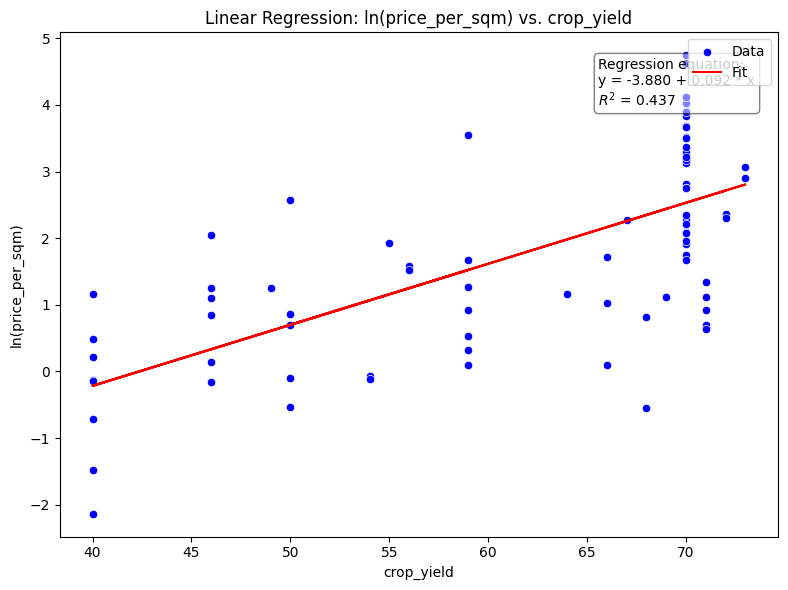

In [13]:
# Import the function
from syvajarvirus55a243 import linear_regression_plot

# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'crop_yield'      # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df, y_column='price_per_sqm', x_column='crop_yield', use_log_y=True, use_log_x=False)

In [14]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'crop_yield'      # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df, y_column, x_column, use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.437
Model:                            OLS   Adj. R-squared:                  0.430
Method:                 Least Squares   F-statistic:                     64.33
Date:                Tue, 29 Oct 2024   Prob (F-statistic):           5.92e-12
Time:                        14:34:57   Log-Likelihood:                -130.77
No. Observations:                  85   AIC:                             265.5
Df Residuals:                      83   BIC:                             270.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.8798      0.720     -5.385      0.0

In [15]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'crop_yield'      # Independent variable
df_filtered = df[df['district'] == 'Омский район'] # Filter the DataFrame for the specific district

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 30 Oct 2024   Prob (F-statistic):                nan
Time:                        12:52:55   Log-Likelihood:                -41.069
No. Observations:                  33   AIC:                             84.14
Df Residuals:                      32   BIC:                             85.63
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
crop_yield     0.7543      0.035     21.583      0.0

In [6]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'crop_yield'            # Independent variable
df_filtered = df[df['district'] != 'Омский район'] # Filter the DataFrame for the specific district

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.233
Method:                 Least Squares   F-statistic:                     16.46
Date:                Thu, 31 Oct 2024   Prob (F-statistic):           0.000174
Time:                        19:57:51   Log-Likelihood:                -71.740
No. Observations:                  52   AIC:                             147.5
Df Residuals:                      50   BIC:                             151.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.8590      0.701     -2.653      0.0

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.


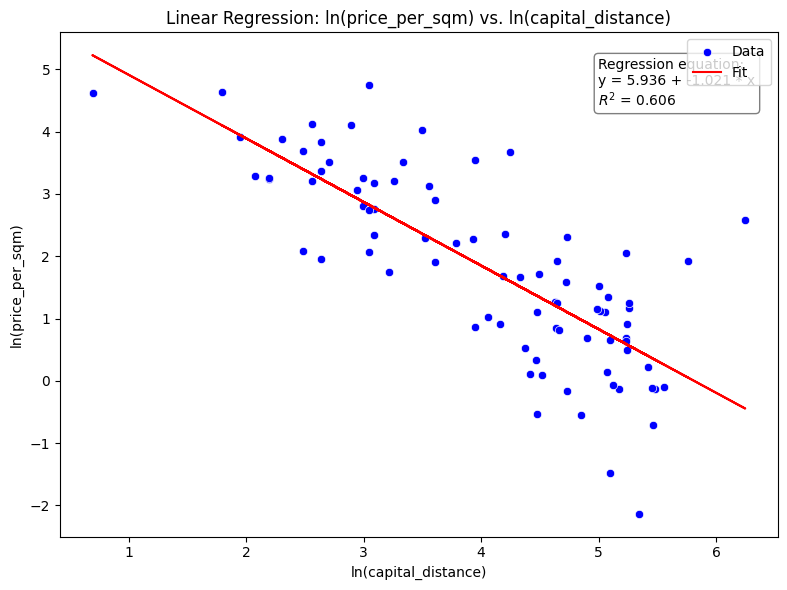

In [5]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'capital_distance'            # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df, y_column=y_column, x_column=x_column, use_log_y=True, use_log_x=True)

In [8]:
# Specify the columns
y_column = 'price_per_sqm'       # Dependent variable
x_column = 'capital_distance'    # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df, y_column, x_column,
                                    use_log_y=True, use_log_x=True)

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.
                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.606
Model:                            OLS   Adj. R-squared:                  0.601
Method:                 Least Squares   F-statistic:                     127.5
Date:                Thu, 31 Oct 2024   Prob (F-statistic):           1.87e-18
Time:                        21:12:31   Log-Likelihood:                -115.60
No. Observations:                  85   AIC:                             235.2
Df Residuals:                      83   BIC:                             240.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

In [20]:
# Filter the DataFrame for the specific district
df_filtered = df[df['district'] == 'Омский район']
print(df_filtered[["capital_distance"]].describe())

       capital_distance
count         33.000000
mean          19.787879
std           16.266833
min            0.000000
25%           10.000000
50%           18.000000
75%           23.000000
max           74.000000


In [22]:
# Specify the columns
y_column = 'price_per_sqm'                         # Dependent variable
x_column = 'capital_distance'                      # Independent variable
df_filtered = df[df['district'] == 'Омский район'] # Filter the DataFrame for the specific district

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=True)

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.
                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.235
Model:                            OLS   Adj. R-squared:                  0.210
Method:                 Least Squares   F-statistic:                     9.531
Date:                Thu, 31 Oct 2024   Prob (F-statistic):            0.00423
Time:                        21:57:17   Log-Likelihood:                -36.646
No. Observations:                  33   AIC:                             77.29
Df Residuals:                      31   BIC:                             80.28
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

In [24]:
# Filter the DataFrame for the specific district
df_filtered = df[df['district'] != 'Омский район']
print(df_filtered[['price_per_sqm']].describe())

       price_per_sqm
count      52.000000
mean        4.593874
std         6.127602
min         0.118334
25%         1.144878
50%         2.500051
75%         5.010264
max        34.883721


In [25]:
# Specify the columns
y_column = 'price_per_sqm'                         # Dependent variable
x_column = 'capital_distance'                      # Independent variable
df_filtered = df[df['district'] != 'Омский район'] # Filter the DataFrame for the specific district

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.191
Model:                            OLS   Adj. R-squared:                  0.175
Method:                 Least Squares   F-statistic:                     11.84
Date:                Thu, 31 Oct 2024   Prob (F-statistic):            0.00118
Time:                        22:23:32   Log-Likelihood:                -73.617
No. Observations:                  52   AIC:                             151.2
Df Residuals:                      50   BIC:                             155.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                4.6541      1.092  

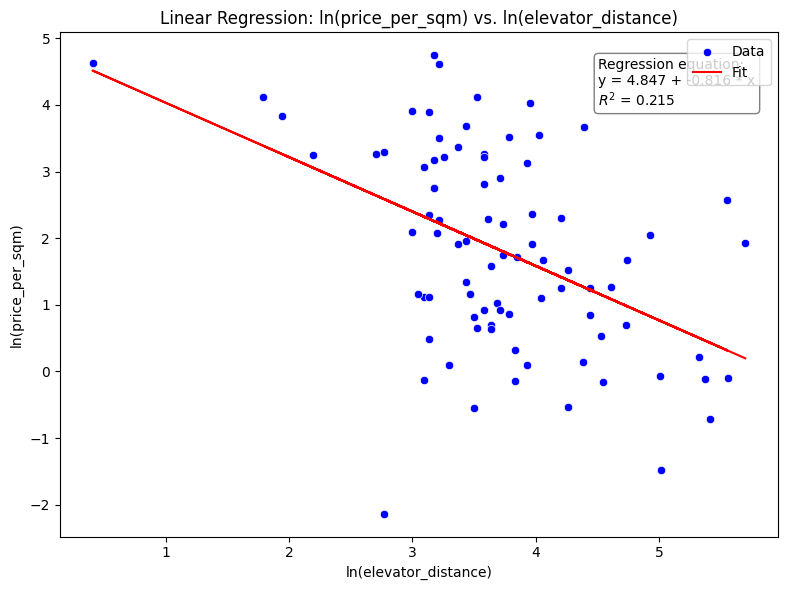

In [6]:
# Specify the columns
y_column = 'price_per_sqm'     # Dependent variable
x_column = 'elevator_distance' # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df, y_column=y_column, x_column=x_column, use_log_y=True, use_log_x=True)

In [8]:
print(df[['elevator_distance']].describe())

       elevator_distance
count          85.000000
mean           59.258824
std            60.024480
min             1.500000
25%            24.500000
50%            38.000000
75%            67.000000
max           299.000000


In [7]:
# Specify the columns
y_column = 'price_per_sqm'        # Dependent variable
x_column = 'elevator_distance'    # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df, y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.215
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     22.74
Date:                Fri, 01 Nov 2024   Prob (F-statistic):           7.82e-06
Time:                        10:37:17   Log-Likelihood:                -144.87
No. Observations:                  85   AIC:                             293.7
Df Residuals:                      83   BIC:                             298.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 4.8469      0.65

In [11]:
# Filter the DataFrame for the specific district
df_filtered = df[df['district'] == 'Омский район']
print(df_filtered[['elevator_distance']].describe())

       elevator_distance
count          33.000000
mean           30.090909
std            16.552216
min             1.500000
25%            23.000000
50%            25.000000
75%            36.000000
max            81.000000


In [12]:
# Specify the columns
y_column = 'price_per_sqm'                          # Dependent variable
x_column = 'elevator_distance'                      # Independent variable
df_filtered = df[df['district'] == 'Омский район']  # Filter the DataFrame for the specific district

# Transformed values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.164
Model:                            OLS   Adj. R-squared:                  0.137
Method:                 Least Squares   F-statistic:                     6.061
Date:                Fri, 01 Nov 2024   Prob (F-statistic):             0.0196
Time:                        11:06:08   Log-Likelihood:                -38.123
No. Observations:                  33   AIC:                             80.25
Df Residuals:                      31   BIC:                             83.24
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 4.6643      0.60

In [13]:
# Filter the DataFrame for the specific district
df_filtered = df[df['district'] != 'Омский район']
print(df_filtered[['elevator_distance']].describe())

       elevator_distance
count          52.000000
mean           77.769231
std            69.731591
min            16.000000
25%            33.000000
50%            46.500000
75%            93.250000
max           299.000000


In [14]:
# Specify the columns
y_column = 'price_per_sqm'                          # Dependent variable
x_column = 'elevator_distance'                      # Independent variable
df_filtered = df[df['district'] != 'Омский район']  # Filter the DataFrame for the specific district

# Transformed values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                 -0.013
Method:                 Least Squares   F-statistic:                    0.3401
Date:                Fri, 01 Nov 2024   Prob (F-statistic):              0.562
Time:                        11:31:12   Log-Likelihood:                -78.965
No. Observations:                  52   AIC:                             161.9
Df Residuals:                      50   BIC:                             165.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 1.4210      0.85

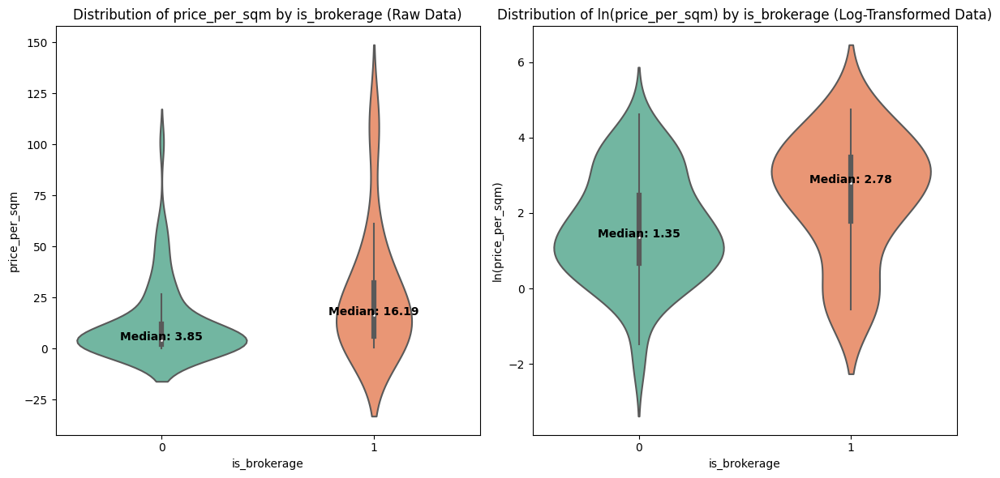

In [3]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

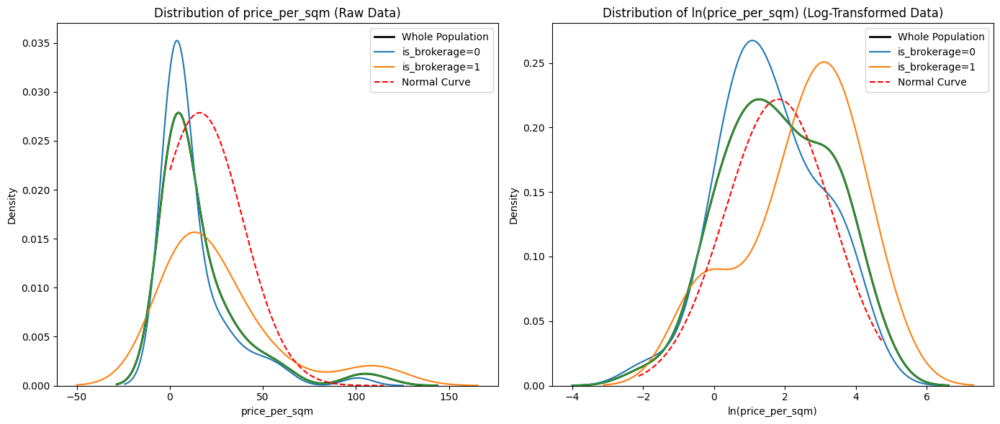

In [3]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function
plot_kde_comparison(df, y_column, x_column)

In [3]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function
results = perform_mann_whitney_tests(df, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 3.8462
Group 1 Median: 16.1907
U Statistic: 466.0000
P-value: 0.0230
Effect Size (Rank-Biserial Correlation): 0.3276
Sample Sizes: n0 = 63, n1 = 22

Log-Transformed Data:
Group 0 Median: 1.3471
Group 1 Median: 2.7840
U Statistic: 466.0000
P-value: 0.0230
Effect Size (Rank-Biserial Correlation): 0.3276
Sample Sizes: n0 = 63, n1 = 22
Log Base Used: 2.718281828459045


In [6]:
# Using a one-sided test
results = perform_mann_whitney_tests(df, y_column, x_column, alternative='less')


Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 3.8462
Group 1 Median: 16.1907
U Statistic: 466.0000
P-value: 0.0115
Effect Size (Rank-Biserial Correlation): 0.3276
Sample Sizes: n0 = 63, n1 = 22

Log-Transformed Data:
Group 0 Median: 1.3471
Group 1 Median: 2.7840
U Statistic: 466.0000
P-value: 0.0115
Effect Size (Rank-Biserial Correlation): 0.3276
Sample Sizes: n0 = 63, n1 = 22
Log Base Used: 2.718281828459045


In [7]:
# Using a one-sided test
results = perform_mann_whitney_tests(df, y_column, x_column, alternative='greater')

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 3.8462
Group 1 Median: 16.1907
U Statistic: 466.0000
P-value: 0.9888
Effect Size (Rank-Biserial Correlation): 0.3276
Sample Sizes: n0 = 63, n1 = 22

Log-Transformed Data:
Group 0 Median: 1.3471
Group 1 Median: 2.7840
U Statistic: 466.0000
P-value: 0.9888
Effect Size (Rank-Biserial Correlation): 0.3276
Sample Sizes: n0 = 63, n1 = 22
Log Base Used: 2.718281828459045


In [10]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function with logarithmic transformation using natural log (default)
results = mann_whitney_effect_sizes(df, y_column, x_column, log_transform=True, alternative='less')

Mann-Whitney U-test Results:
Group 0 (n=63) Median ln(price_per_sqm): 1.3471
Group 1 (n=22) Median ln(price_per_sqm): 2.7840
U Statistic: 466.0000
P-value: 0.0115
Z Statistic: -2.2827
Effect Size r: -0.2476
Cliff's Delta: 0.3276
Cliff's Delta CI (95.0%): (0.0457, 0.6094)
Logarithmic transformation applied using base 2.718281828459045.


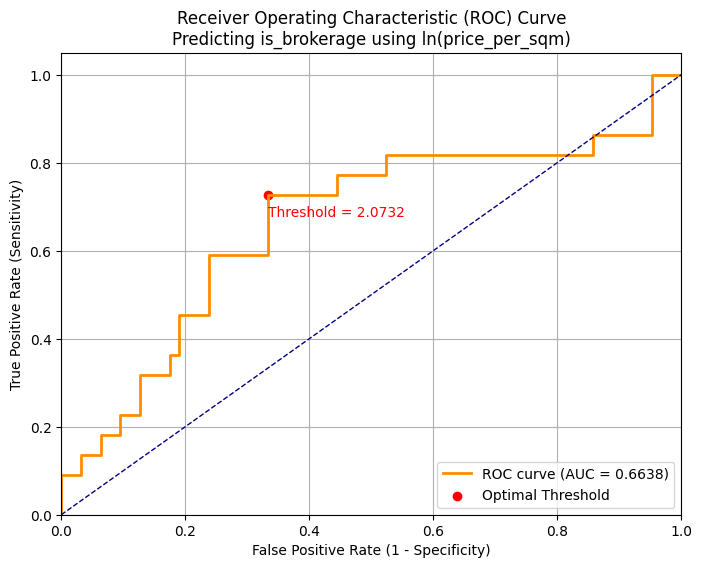

ROC Analysis Results:
AUC: 0.6638
Optimal Threshold: 2.0732
True Positive Rate at Optimal Threshold (Sensitivity): 0.7273
False Positive Rate at Optimal Threshold: 0.3333
Specificity at Optimal Threshold: 0.6667
Accuracy at Optimal Threshold: 0.6824
Precision at Optimal Threshold: 0.4324
Recall (Sensitivity) at Optimal Threshold: 0.7273
F1 Score at Optimal Threshold: 0.5424

Confusion Matrix at Optimal Threshold:
TN: 42, FP: 21, FN: 6, TP: 16

Logarithmic transformation applied using base 2.718281828459045.


In [5]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous predictor variable
x_column = 'is_brokerage'   # Binary outcome variable

# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df, y_column, x_column, log_transform=True)


In [3]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous predictor variable
x_column = 'is_brokerage'   # Binary outcome variable

# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df, y_column, x_column, log_transform=True)


Logistic Regression Results:
Coefficients:
const           -1.893489
price_per_sqm    0.414401
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.150546  0.058552  0.387077
price_per_sqm  1.513463  1.057716  2.165583

Model Fit Statistics:
Log-Likelihood: -45.7762
AIC: 95.5524
BIC: 100.4377
Pseudo R-squared: 0.0582

Classification Performance at Threshold 0.2622:
Accuracy: 0.6824
Precision: 0.4324
Recall (Sensitivity): 0.7273
Specificity: 0.6667
F1 Score: 0.5424

ROC AUC: 0.6638

Optimal threshold (Youden's Index): 0.2622

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           42           21
Actual 1            6           16


In [7]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_brokerage'     # Independent variable

# Transformed values for both Y and X
results = perform_linear_regression(df,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.064
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     5.674
Date:                Sun, 03 Nov 2024   Prob (F-statistic):             0.0195
Time:                        15:48:37   Log-Likelihood:                -152.35
No. Observations:                  85   AIC:                             308.7
Df Residuals:                      83   BIC:                             313.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.5887      0.185      8.578   

In [8]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_brokerage'     # Independent variable
df_filtered = df[df['district'] == 'Омский район']  # Filter the DataFrame for the specific district

# Transformed values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                 -0.027
Method:                 Least Squares   F-statistic:                    0.1531
Date:                Sun, 03 Nov 2024   Prob (F-statistic):              0.698
Time:                        15:52:26   Log-Likelihood:                -40.988
No. Observations:                  33   AIC:                             85.98
Df Residuals:                      31   BIC:                             88.97
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            3.1475      0.210     15.012   

In [9]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_brokerage'     # Independent variable
df_filtered = df[df['district'] != 'Омский район']  # Filter the DataFrame for the specific district

# Transformed values for both Y and X
results = perform_linear_regression(df_filtered,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.043
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     2.221
Date:                Sun, 03 Nov 2024   Prob (F-statistic):              0.142
Time:                        15:54:08   Log-Likelihood:                -78.011
No. Observations:                  52   AIC:                             160.0
Df Residuals:                      50   BIC:                             163.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.0126      0.163      6.209   

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


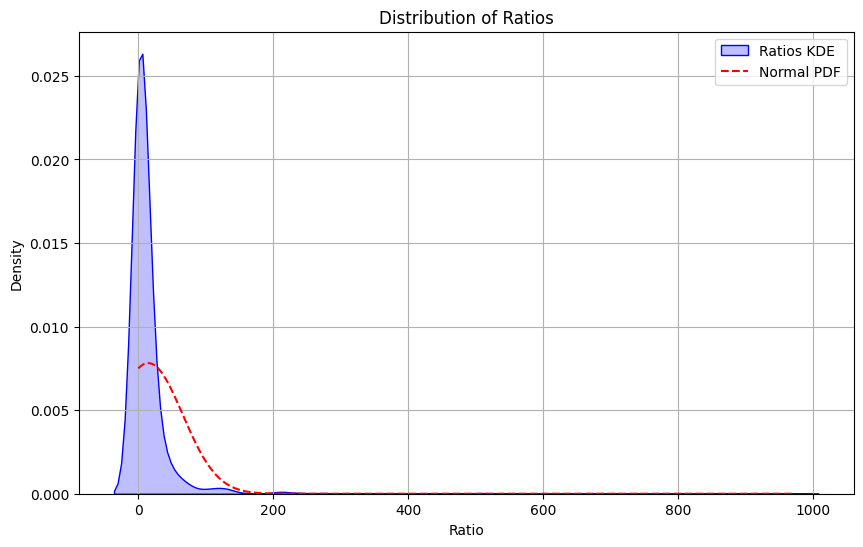

Mean of Ratios: 14.7074
Median of Ratios: 2.8340
95% Confidence Interval of Mean: (12.0180, 17.3968)
Shapiro-Wilk Test Statistic: 0.2513
Shapiro-Wilk Test p-value: 0.0000e+00
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [6]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_brokerage'     # Independent variable

# Transformed values for both Y and X
results = compare_groups_with_ratios(df, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


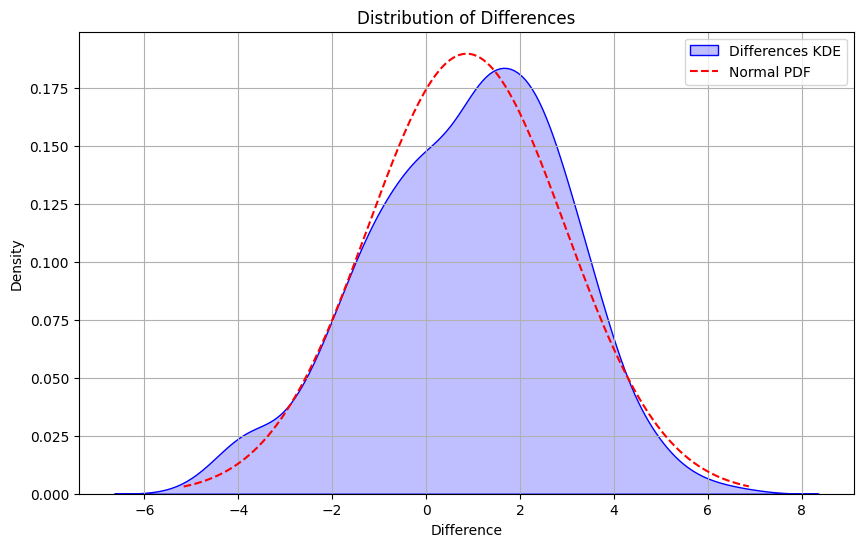

Mean of Differences: 0.8671
Median of Differences: 1.0417
95% Confidence Interval of Mean: (0.7564, 0.9779)
Shapiro-Wilk Test Statistic: 0.9927
Shapiro-Wilk Test p-value: 2.1730e-06
The distribution of differences is significantly different from normal (reject null hypothesis at alpha=0.05).


In [3]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_brokerage'     # Independent variable

# Transformed values for both Y and X
results = compare_groups_with_differences(df, y_column, x_column, log_transform=True)

In [9]:
df['is_south'] = list(map(lambda x: 1 if x == 'south' else 0, df['climate_zone']))

In [10]:
print(df[['is_south']].describe())

        is_south
count  85.000000
mean    0.647059
std     0.480721
min     0.000000
25%     0.000000
50%     1.000000
75%     1.000000
max     1.000000


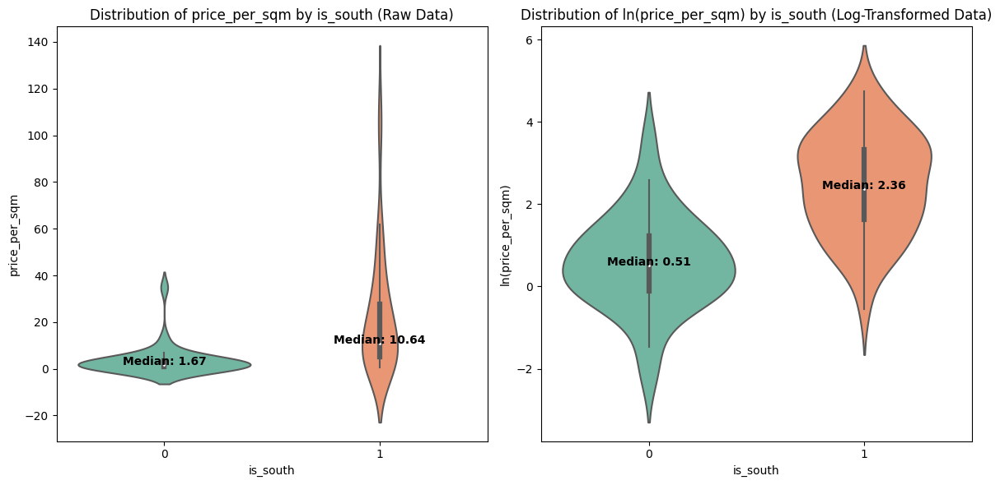

In [11]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_south'   # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

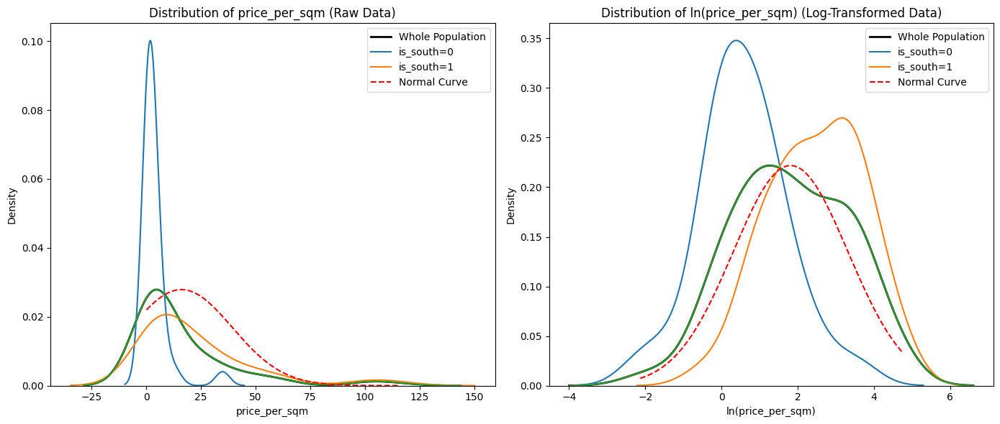

In [12]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_south'       # Binary variable with values 0 and 1

# Call the function
plot_kde_comparison(df, y_column, x_column)

In [13]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_south'   # Binary variable with values 0 and 1

# Call the function
results = perform_mann_whitney_tests(df, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 1.6678
Group 1 Median: 10.6383
U Statistic: 219.0000
P-value: 0.0000
Effect Size (Rank-Biserial Correlation): 0.7345
Sample Sizes: n0 = 30, n1 = 55

Log-Transformed Data:
Group 0 Median: 0.5113
Group 1 Median: 2.3645
U Statistic: 219.0000
P-value: 0.0000
Effect Size (Rank-Biserial Correlation): 0.7345
Sample Sizes: n0 = 30, n1 = 55
Log Base Used: 2.718281828459045


In [14]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_south'   # Binary variable with values 0 and 1

# Call the function with logarithmic transformation using natural log (default)
results = mann_whitney_effect_sizes(df, y_column, x_column, log_transform=True)

Mann-Whitney U-test Results:
Group 0 (n=30) Median ln(price_per_sqm): 0.5113
Group 1 (n=55) Median ln(price_per_sqm): 2.3645
U Statistic: 219.0000
P-value: 0.0000
Z Statistic: -5.5728
Effect Size r: -0.6045
Cliff's Delta: 0.7345
Cliff's Delta CI (95.0%): (0.4762, 0.9929)
Logarithmic transformation applied using base 2.718281828459045.


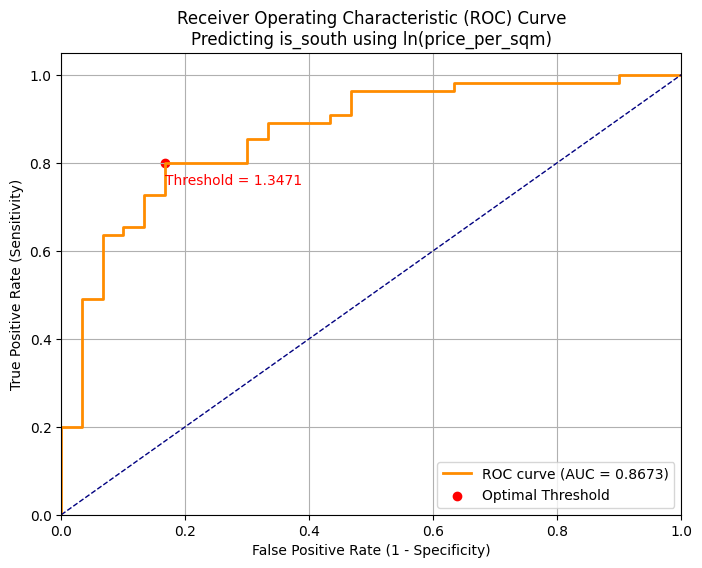

ROC Analysis Results:
AUC: 0.8673
Optimal Threshold: 1.3471
True Positive Rate at Optimal Threshold (Sensitivity): 0.8000
False Positive Rate at Optimal Threshold: 0.1667
Specificity at Optimal Threshold: 0.8333
Accuracy at Optimal Threshold: 0.8118
Precision at Optimal Threshold: 0.8980
Recall (Sensitivity) at Optimal Threshold: 0.8000
F1 Score at Optimal Threshold: 0.8462

Confusion Matrix at Optimal Threshold:
TN: 25, FP: 5, FN: 11, TP: 44

Logarithmic transformation applied using base 2.718281828459045.


In [15]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous predictor variable
x_column = 'is_south'   # Binary outcome variable

# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df, y_column, x_column, log_transform=True)

In [16]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous predictor variable
x_column = 'is_south'   # Binary outcome variable

# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df, y_column, x_column, log_transform=True)


Logistic Regression Results:
Coefficients:
const           -1.357525
price_per_sqm    1.319221
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.257297  0.101485  0.652328
price_per_sqm  3.740506  2.100191  6.661959

Model Fit Statistics:
Log-Likelihood: -36.1433
AIC: 76.2866
BIC: 81.1719
Pseudo R-squared: 0.3451

Classification Performance at Threshold 0.6034:
Accuracy: 0.8118
Precision: 0.8980
Recall (Sensitivity): 0.8000
Specificity: 0.8333
F1 Score: 0.8462

ROC AUC: 0.8673

Optimal threshold (Youden's Index): 0.6034

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           25            5
Actual 1           11           44


In [17]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_south'         # Independent variable

# Transformed values for both Y and X
results = perform_linear_regression(df,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.369
Model:                            OLS   Adj. R-squared:                  0.361
Method:                 Least Squares   F-statistic:                     48.44
Date:                Sun, 03 Nov 2024   Prob (F-statistic):           7.31e-10
Time:                        19:46:49   Log-Likelihood:                -135.62
No. Observations:                  85   AIC:                             275.2
Df Residuals:                      83   BIC:                             280.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5789      0.220      2.626      0.0

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


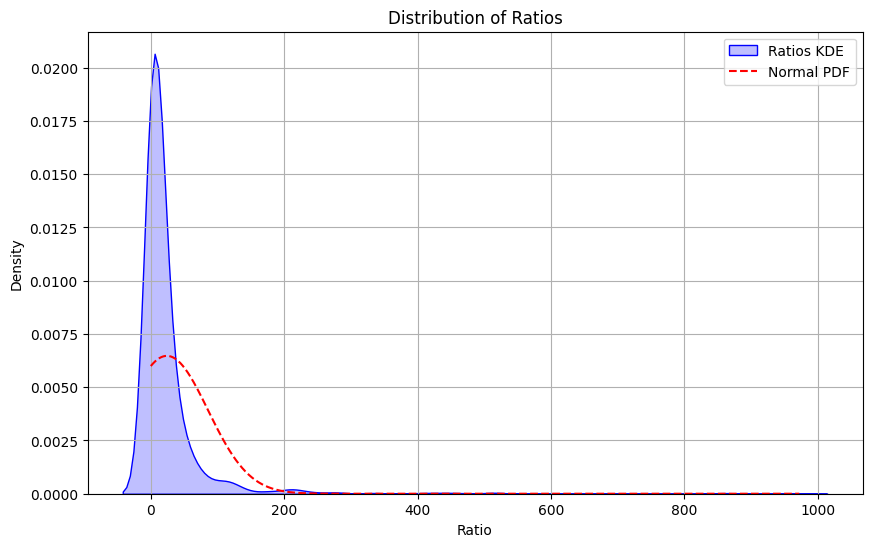

Mean of Ratios: 24.1349
Median of Ratios: 7.2370
95% Confidence Interval of Mean: (21.1582, 27.1116)
Shapiro-Wilk Test Statistic: 0.3534
Shapiro-Wilk Test p-value: 0.0000e+00
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [18]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_south'     # Independent variable

# Transformed values for both Y and X
results = compare_groups_with_ratios(df, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


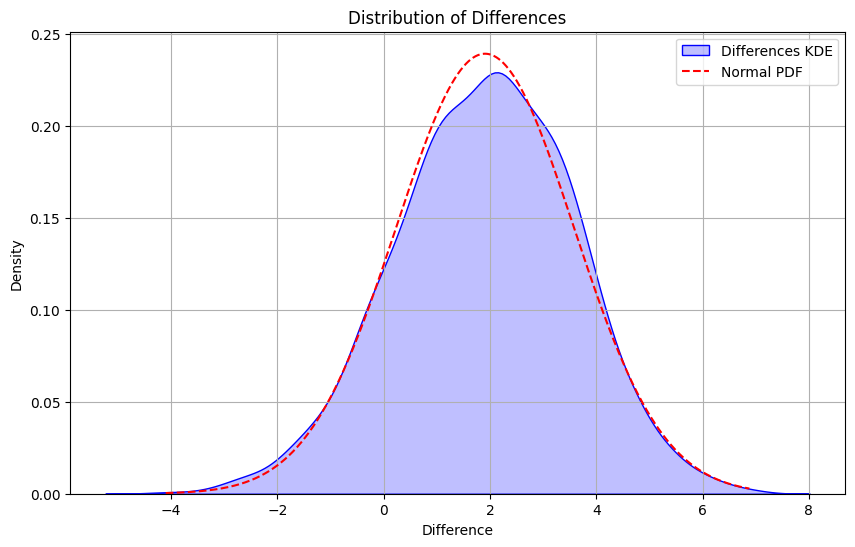

Mean of Differences: 1.9074
Median of Differences: 1.9792
95% Confidence Interval of Mean: (1.8268, 1.9879)
Shapiro-Wilk Test Statistic: 0.9982
Shapiro-Wilk Test p-value: 7.0324e-02
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [19]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_south'     # Independent variable

# Transformed values for both Y and X
results = compare_groups_with_differences(df, y_column, x_column, log_transform=True)

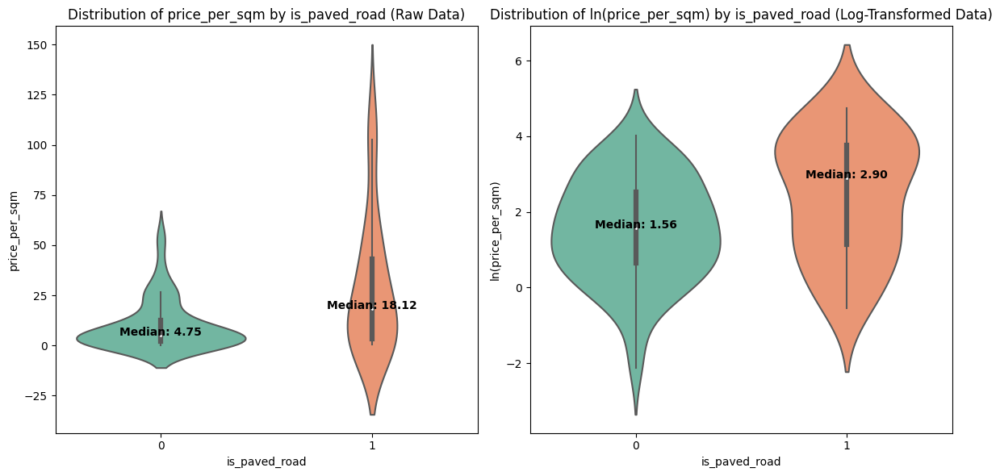

In [16]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_paved_road'    # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df, y_column, x_column)

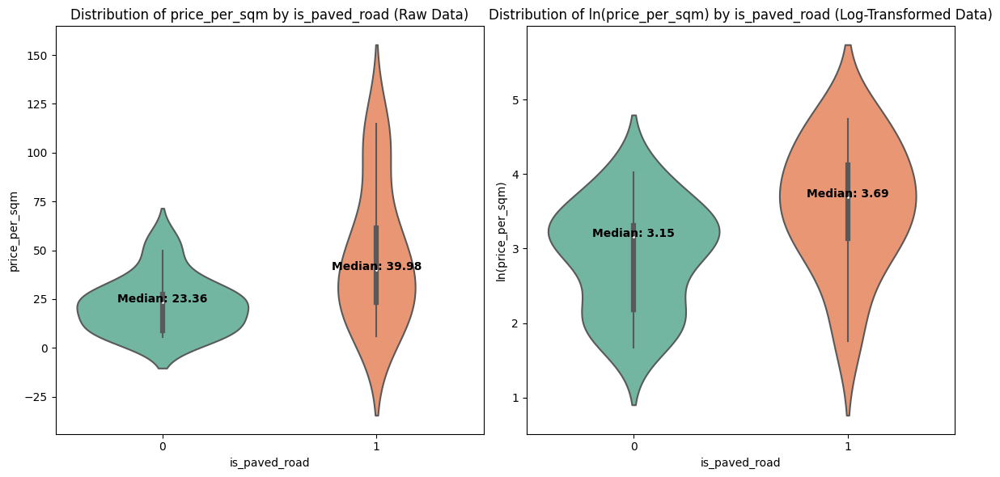

In [18]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_paved_road'    # Binary variable with values 0 and 1

# Specify needed districts
included_districts = ['Омский район', 'Азовский немецкий национальный район']  # List of districts to include
df_filtered = df[df['district'].isin(included_districts)]

# Call the function
plot_violin_comparison(df_filtered, y_column, x_column)

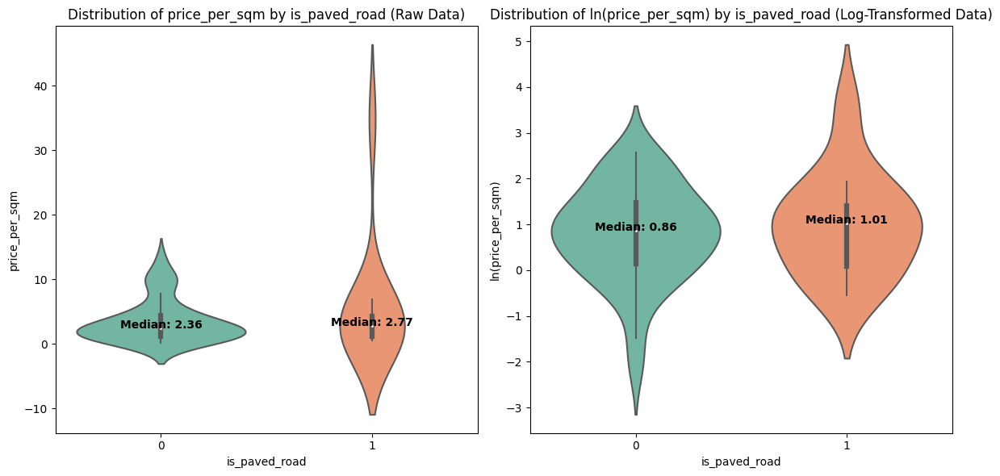

In [20]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_paved_road'    # Binary variable with values 0 and 1

# Specify needed districts
excluded_districts = ['Омский район', 'Азовский немецкий национальный район']  # List of districts to include
df_filtered = df[~df['district'].isin(excluded_districts)]

# Call the function
plot_violin_comparison(df_filtered, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

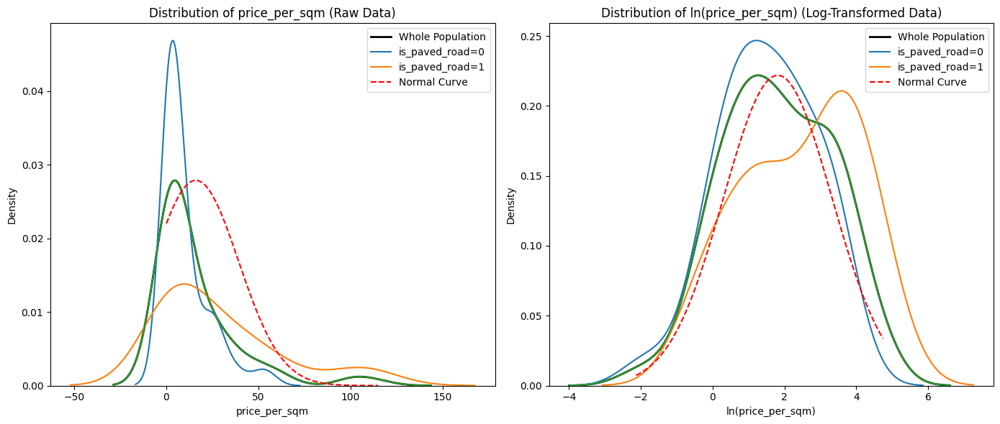

In [21]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_paved_road'    # Binary variable with values 0 and 1

# Call the function
plot_kde_comparison(df, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

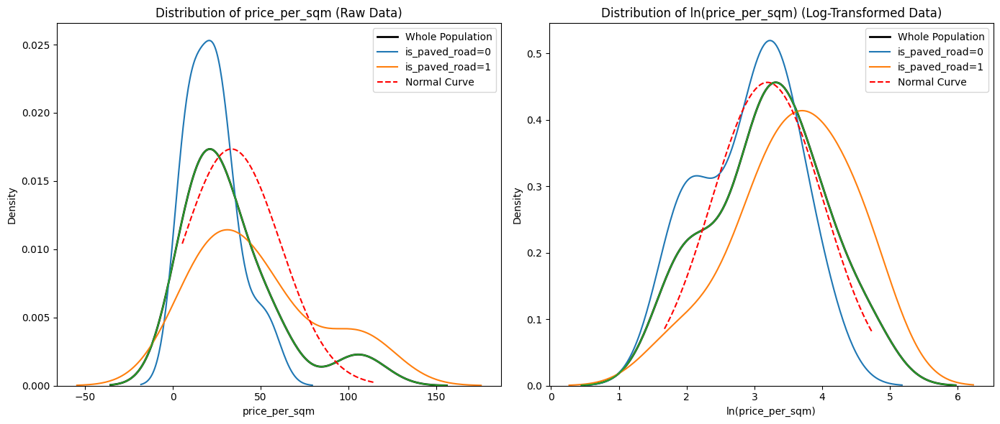

In [23]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_paved_road'    # Binary variable with values 0 and 1

# Specify needed districts
included_districts = ['Омский район', 'Азовский немецкий национальный район']  # List of districts to include
df_filtered = df[df['district'].isin(included_districts)]  # Filter the DataFrame for the specific district

# Call the function
plot_kde_comparison(df_filtered, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

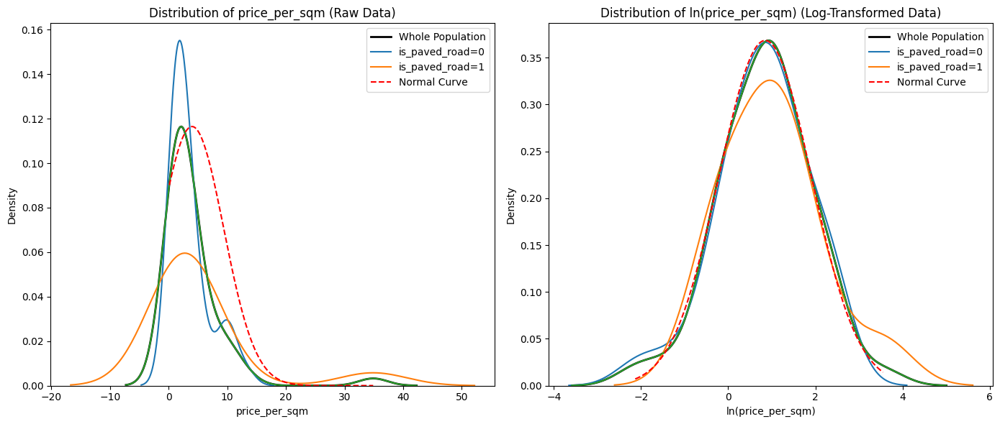

In [24]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_paved_road'    # Binary variable with values 0 and 1

# Specify needed districts
excluded_districts = ['Омский район', 'Азовский немецкий национальный район']  # List of districts to include
df_filtered = df[~df['district'].isin(excluded_districts)]  # Filter the DataFrame for the specific district

# Call the function
plot_kde_comparison(df_filtered, y_column, x_column)

In [25]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_paved_road'   # Binary variable with values 0 and 1

# Call the function
results = perform_mann_whitney_tests(df, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 4.7539
Group 1 Median: 18.1166
U Statistic: 524.0000
P-value: 0.0147
Effect Size (Rank-Biserial Correlation): 0.3308
Sample Sizes: n0 = 58, n1 = 27

Log-Transformed Data:
Group 0 Median: 1.5585
Group 1 Median: 2.8968
U Statistic: 524.0000
P-value: 0.0147
Effect Size (Rank-Biserial Correlation): 0.3308
Sample Sizes: n0 = 58, n1 = 27
Log Base Used: 2.718281828459045


In [26]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_paved_road'   # Binary variable with values 0 and 1

# Specify needed districts
included_districts = ['Омский район', 'Азовский немецкий национальный район']  # List of districts to include
df_filtered = df[df['district'].isin(included_districts)]  # Filter the DataFrame for the specific district

# Call the function
results = perform_mann_whitney_tests(df_filtered, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 23.3629
Group 1 Median: 39.9846
U Statistic: 80.0000
P-value: 0.0205
Effect Size (Rank-Biserial Correlation): 0.4667
Sample Sizes: n0 = 20, n1 = 15

Log-Transformed Data:
Group 0 Median: 3.1509
Group 1 Median: 3.6885
U Statistic: 80.0000
P-value: 0.0205
Effect Size (Rank-Biserial Correlation): 0.4667
Sample Sizes: n0 = 20, n1 = 15
Log Base Used: 2.718281828459045


In [28]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_paved_road'   # Binary variable with values 0 and 1

# Specify needed districts
excluded_districts = ['Омский район', 'Азовский немецкий национальный район']  # List of districts to include
df_filtered = df[~df['district'].isin(excluded_districts)]  # Filter the DataFrame for the specific district

# Call the function
results = perform_mann_whitney_tests(df_filtered, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 2.3587
Group 1 Median: 2.7685
U Statistic: 217.0000
P-value: 0.8115
Effect Size (Rank-Biserial Correlation): 0.0482
Sample Sizes: n0 = 38, n1 = 12

Log-Transformed Data:
Group 0 Median: 0.8581
Group 1 Median: 1.0136
U Statistic: 217.0000
P-value: 0.8115
Effect Size (Rank-Biserial Correlation): 0.0482
Sample Sizes: n0 = 38, n1 = 12
Log Base Used: 2.718281828459045


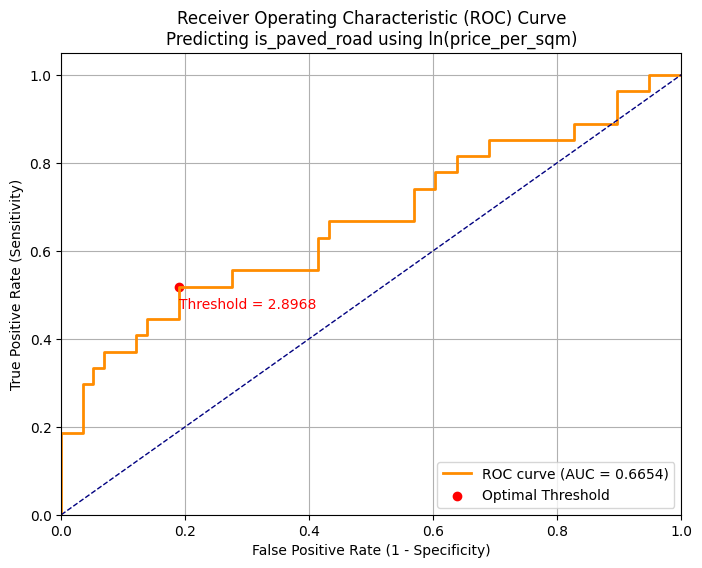

ROC Analysis Results:
AUC: 0.6654
Optimal Threshold: 2.8968
True Positive Rate at Optimal Threshold (Sensitivity): 0.5185
False Positive Rate at Optimal Threshold: 0.1897
Specificity at Optimal Threshold: 0.8103
Accuracy at Optimal Threshold: 0.7176
Precision at Optimal Threshold: 0.5600
Recall (Sensitivity) at Optimal Threshold: 0.5185
F1 Score at Optimal Threshold: 0.5385

Confusion Matrix at Optimal Threshold:
TN: 47, FP: 11, FN: 13, TP: 14

Logarithmic transformation applied using base 2.718281828459045.


In [29]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous predictor variable
x_column = 'is_paved_road'   # Binary outcome variable

# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df, y_column, x_column, log_transform=True)